# Load data

In [1]:
data_dir = 'C:/Data/Antonio/Philip/081114Patch clamp/nanorods 630/fov2 - good/122055_take2 100Hz'
dataset_label = 'Take2'

In [2]:
from __future__ import division
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display
import numpy as np
import scipy.ndimage as ndi
sns.set_context(rc={'lines.markeredgewidth': 1})  # workaround for a bug in matplotlib 1.4.2
from IPython.display import FileLink

In [3]:
from IPython.core.display import HTML
HTML(open("./styles/custom2.css", "r").read())

In [4]:
from figscroller import FrameScroller, HorizontalScroller
from patchclamp import PatchDataset
import timetraces as tt

In [5]:
data = PatchDataset(data_dir)

In [6]:
data.params['Square frame rate (Hz)']

400.0

The attributes `data.voltage/current/time` are resampled at the camera frame rate:

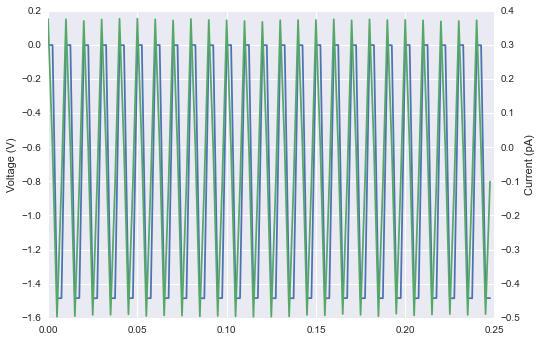

In [7]:
plt.plot(data.time[:100], data.voltage[:100], label='Voltage')
plt.ylabel('Voltage (V)')
plt.twinx()
plt.plot(data.time[:100], data.current[:100], label='Current',
         color=sns.color_palette()[1])
plt.ylabel('Current (pA)')
plt.grid(False)
plt.xlabel('Time (s)')

In [8]:
sns.set_style('dark')

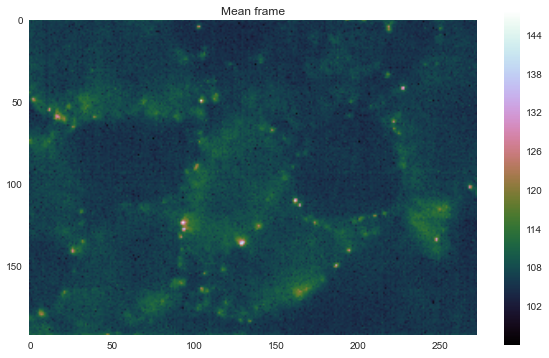

In [9]:
fig, ax = plt.subplots(figsize=(10, 6))
im = ax.imshow(data.video.mean(0), cmap='cubehelix')
plt.colorbar(im);
ax.set_title('Mean frame')

# Video Filtering

## Mean frame

In [10]:
mvideo = data.video.mean(0)
mvideo.shape, mvideo.dtype

((192L, 272L), dtype('float64'))

In [11]:
mvideo_highpass = mvideo - ndi.gaussian_filter(mvideo, sigma=8)
th = mvideo_highpass > 0.4*mvideo_highpass.max()

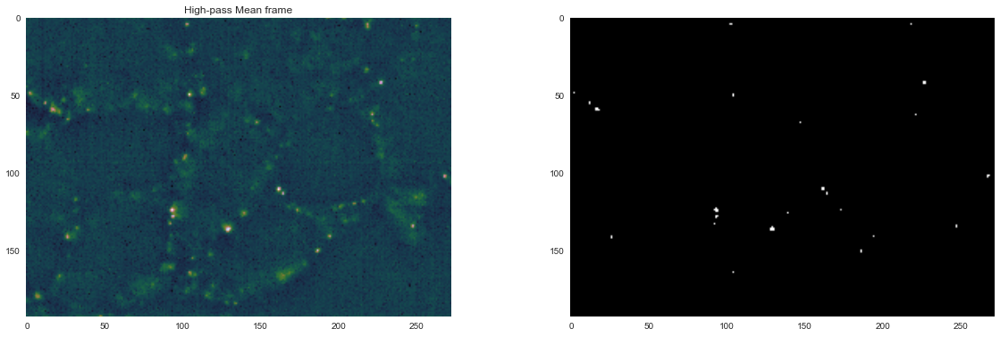

In [12]:
fig, ax = plt.subplots(1, 2, figsize=(20, 6))
im = ax[0].imshow(mvideo_highpass, cmap='cubehelix')
#plt.colorbar(im);
im = ax[1].imshow(th, cmap='cubehelix')
ax[0].set_title('High-pass Mean frame')

## Full-video

In [13]:
video_highpass = data.video - ndi.gaussian_filter(data.video.astype('float'), sigma=(6, 6, 10))
# video_highpass.shape, video_highpass.dtype

# fig, ax = plt.subplots(figsize=(10, 6))
# im = ax.imshow(video_highpass.mean(0), cmap='cubehelix')
# plt.colorbar(im);
# ax.set_title('Mean frame after HPF')

In [14]:
video_highpass.shape

(1996L, 192L, 272L)

In [15]:
data.video.mean(), video_highpass.mean()

(106.97237234502707, -8.8551508304912744e-14)

In [16]:
video_highpass_tm = video_highpass - video_highpass.mean(axis=0)
video_highpass_tm.shape, video_highpass_tm.dtype

((1996L, 192L, 272L), dtype('float64'))

In [17]:
video_highpass_on = np.zeros(data.video.shape[1:])
for row in range(data.video.shape[1]):
    for col in range(data.video.shape[2]):
        on_periods = video_highpass_tm[:, row, col] > 0
        video_highpass_on[row, col] = video_highpass_tm[on_periods, row, col].mean()
video_highpass_on.shape, video_highpass_on.dtype

((192L, 272L), dtype('float64'))

In [18]:
hp_frame = ndi.gaussian_filter(video_highpass_on, sigma=0.3)

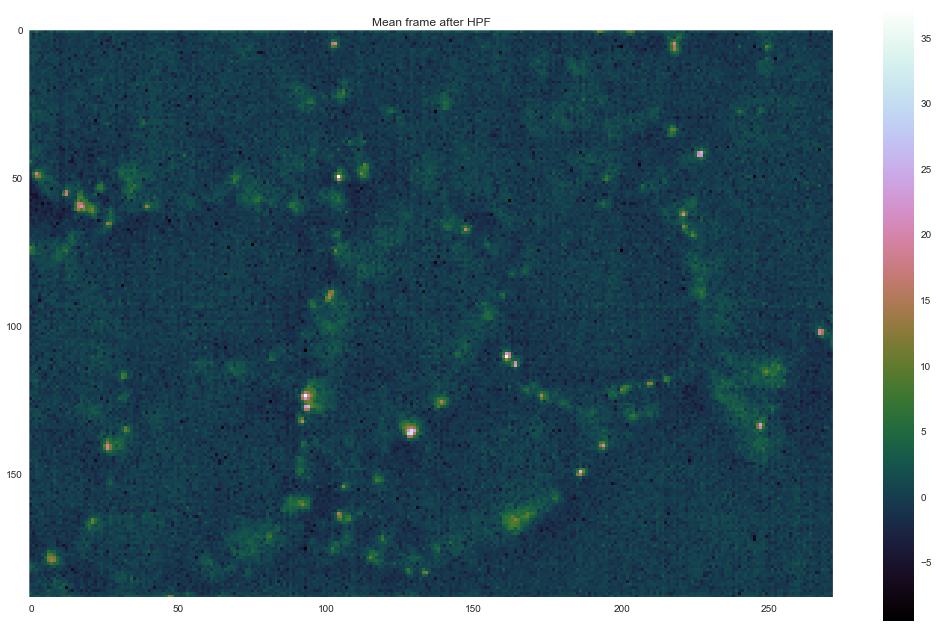

In [19]:
fig, ax = plt.subplots(figsize=(18, 11))
im = ax.imshow(video_highpass.mean(0), cmap='cubehelix', interpolation='none')
plt.colorbar(im);
ax.set_title('Mean frame after HPF');

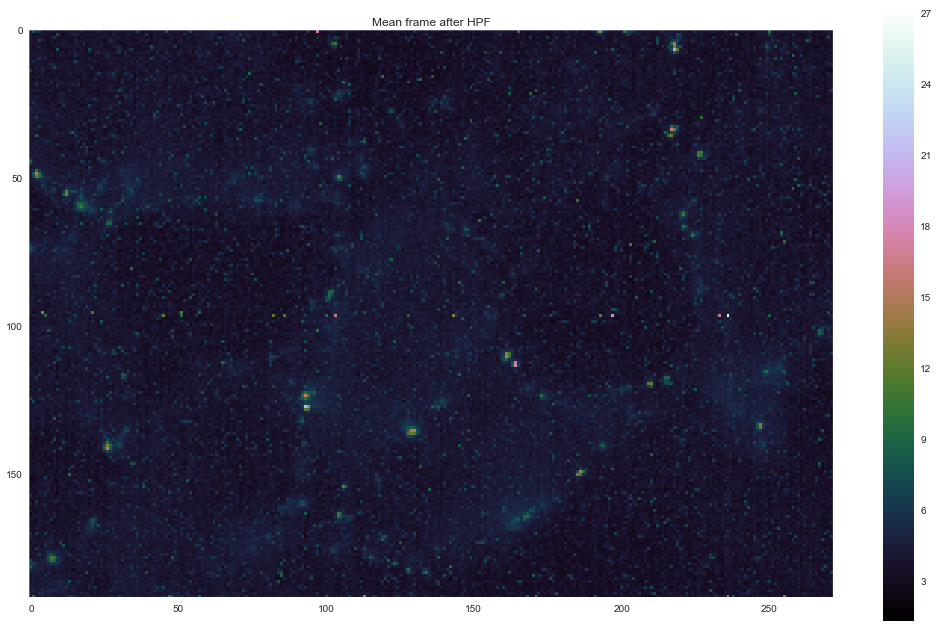

In [20]:
fig, ax = plt.subplots(figsize=(18, 11))
im = ax.imshow(video_highpass_on, cmap='cubehelix', interpolation='none')
plt.colorbar(im);
ax.set_title('Mean frame after HPF');

# QD positions and ROIs

In [21]:
# %matplotlib qt
# sns.set_style('dark')

Explore the video frame by frame:

In [22]:
# fig, ax = plt.subplots(figsize=(14, 9))
# im = ax.imshow(data.video.mean(0), cmap='cubehelix', interpolation='none')
# plt.colorbar(im)

# #scroller = FrameScroller(fig, im, data.video)
# points = plt.ginput(1, timeout=0)
# points

In [23]:
# fig, ax = plt.subplots(figsize=(14, 9))
# im = ax.imshow(frame, cmap='cubehelix', interpolation='none')
# plt.colorbar(im)
# points = plt.ginput(3, timeout=0)
# points

Or use only the mean frame:

In [24]:
# frame = data.video.mean(0)

# fig, ax = plt.subplots(figsize=(14, 9))
# im = ax.imshow(frame, cmap='cubehelix')
# plt.colorbar(im)
# #points = plt.ginput(10, timeout=0)
# #points

## QD on patched cell

In [25]:
frame = data.video.mean(0)

In [26]:
%matplotlib inline
sns.set_style('dark')

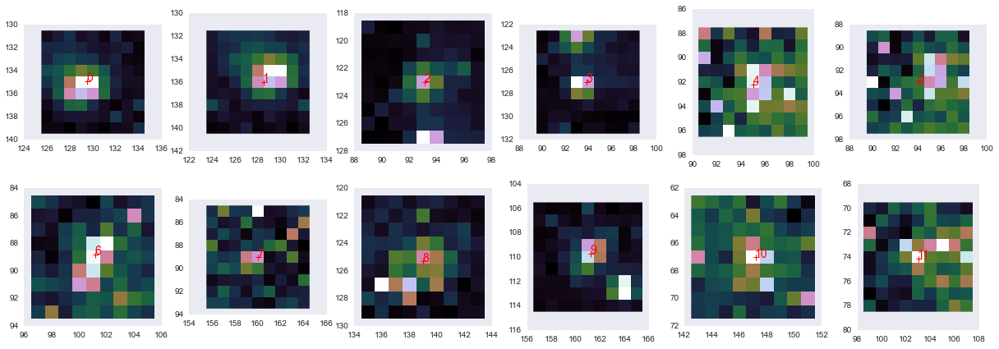

In [27]:
points_patched = \
    [(129.5, 134.9),
     (128.5, 136.),
     (93.1, 123),
     (93.9, 127),
     (95, 92.2),
     (94, 93),
     (101.2, 88.8),
     (160, 89),
     (139, 125.3),
     (161.2, 109.7),
     (147.2, 67),
     (103., 74.1)]
    
nrows = 2
npoints = len(points_patched)
even_npoints = npoints if npoints % 2 == 0 else npoints + 1
ncols = even_npoints // 2

fig, ax = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3.5*nrows))
axr = ax.ravel()
for ip, point in enumerate(points_patched):
    rpoint = np.round(point)
    roi = tt.get_roi_square(rpoint, pad=4)
    axr[ip].imshow(hp_frame[roi], cmap='cubehelix', interpolation='none',
                   extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    axr[ip].plot(point[0], point[1], 'r+')
    axr[ip].annotate('%d' % ip, point, color='red', fontsize=14)

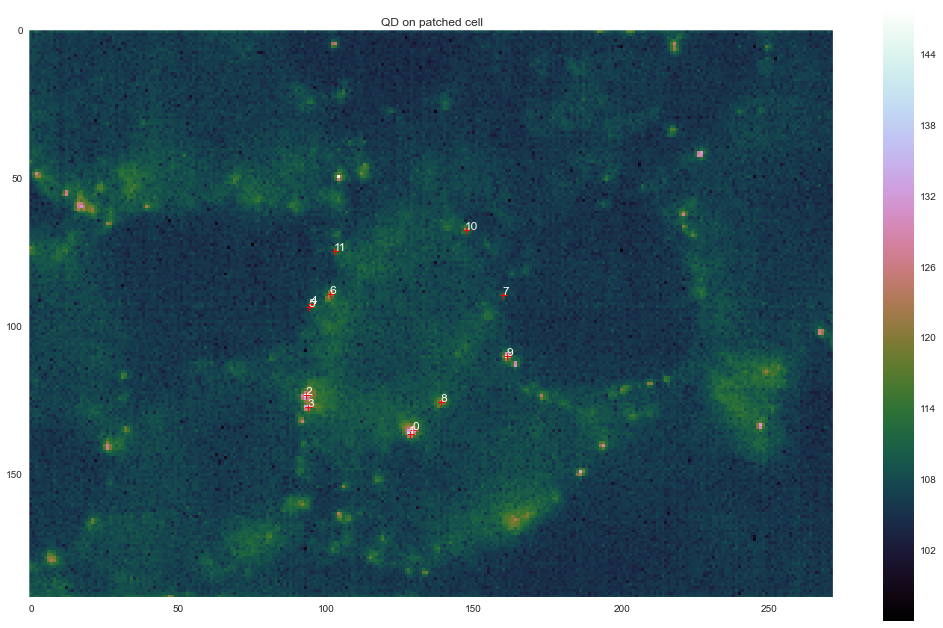

In [28]:
fig, ax = plt.subplots(figsize=(18, 11))
for ip, point in enumerate(points_patched):
    plt.plot(point[0], point[1], 'r+')
    plt.annotate('%d' % ip, point, color='white', fontsize=12)
im = ax.imshow(data.video.mean(0), cmap='cubehelix', interpolation='none')
plt.colorbar(im);
ax.set_title('QD on patched cell')

### QDs selection: unique positions

In [29]:
ipoints_patched_sel = [i for i in range(len(points_patched)) if i not in (1, 5)]
points_patched_sel = [points_patched[i] for i in ipoints_patched_sel]

## QD unpatched cells

In [30]:
%matplotlib inline
sns.set_style('dark')

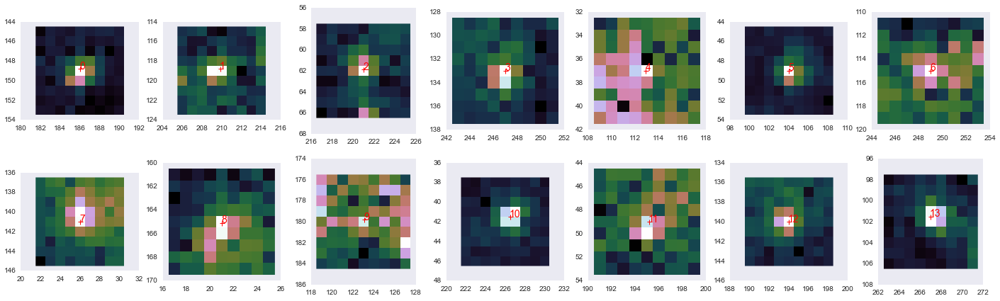

In [31]:
points_unpatched = \
    [(186, 148.8),
     (209.9, 118.8),
     (221, 61.9),
     (247., 133.),
     #(211., 28),
     (112.9, 37.),
     (104, 49),
     (249., 115.),
     #(49.9, 59),
     (26, 141),
     (21, 165.1),   # 10
     (123.1, 179.8),
     (226.5, 41.5),
     #(226.39516129032253, 83.846774193548384),
     (195.2, 49),
     (194, 140),
     (267, 101.5),
    ]
    
nrows = 2
npoints = len(points_unpatched)
even_npoints = npoints if npoints % 2 == 0 else npoints + 1
ncols = even_npoints // 2

fig, ax = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3.5*nrows))
axr = ax.ravel()
for ip, point in enumerate(points_unpatched):
    rpoint = np.round(point)
    roi = tt.get_roi_square(rpoint, pad=4)
    axr[ip].imshow(frame[roi], cmap='cubehelix', interpolation='none',
                   extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    axr[ip].plot(point[0], point[1], 'r+')
    axr[ip].annotate('%d' % ip, point, color='red', fontsize=14)

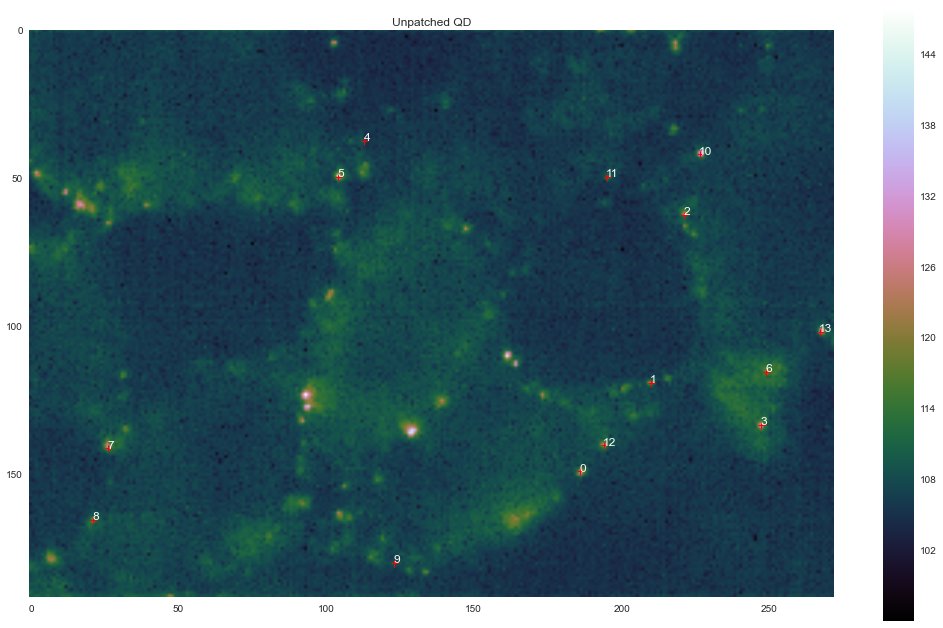

In [32]:
fig, ax = plt.subplots(figsize=(18, 11))
for ip, point in enumerate(points_unpatched):
    plt.plot(point[0], point[1], 'r+')
    plt.annotate('%d' % ip, point, color='white', fontsize=12)
im = ax.imshow(data.video.mean(0), cmap='cubehelix')
plt.colorbar(im);
ax.set_title('Unpatched QD');

### QDs selection: non-nearest neighbour cell

In [33]:
ipoints_unpatched_sel = (2, 3, 6, 10, 13)
points_unpatched_sel = [points_unpatched[i] for i in ipoints_unpatched_sel]

## Test round ROI

In [34]:
sns.set_style('darkgrid')

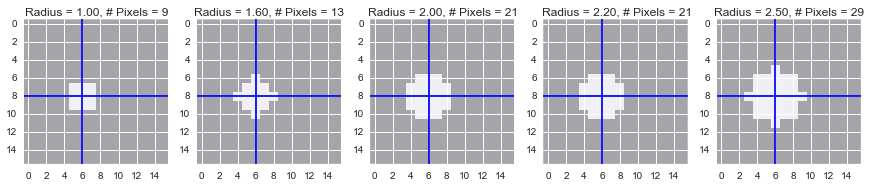

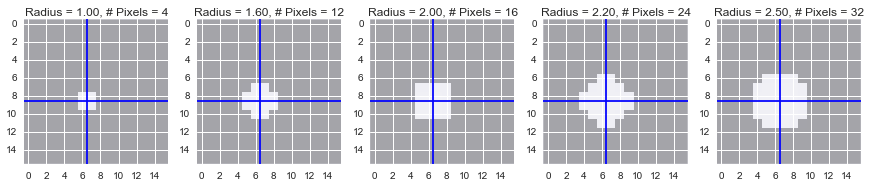

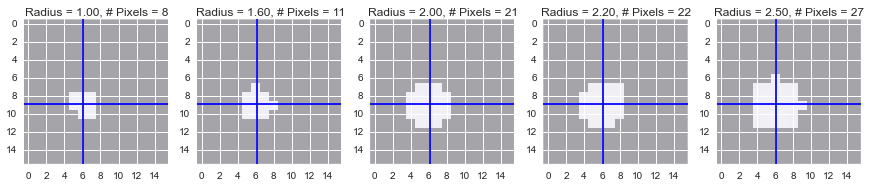

In [35]:
shape2d = (16, 16)
radii = [1, 1.6, 2, 2.2, 2.5]
point = (6, 8)

fig, ax = plt.subplots(1, len(radii), figsize=(3*len(radii), 3))
for i, clip_radius in enumerate(radii):
    mask = tt.get_roi_circle(point, clip_radius, shape2d)
    a = np.zeros(shape2d)
    a[mask] = 1
    im = ax[i].imshow(a, interpolation='none', cmap='gray', alpha=0.3)
    ax[i].axvline(point[0])
    ax[i].axhline(point[1])
    ax[i].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))
    
point = (point[0]+0.5, point[1]+0.5)
fig, ax = plt.subplots(1, len(radii), figsize=(3*len(radii), 3))
for i, clip_radius in enumerate(radii):
    mask = tt.get_roi_circle(point, clip_radius, shape2d)
    a = np.zeros(shape2d)
    a[mask] = 1
    im = ax[i].imshow(a, interpolation='none', cmap='gray', alpha=0.3)
    ax[i].axvline(point[0])
    ax[i].axhline(point[1])
    ax[i].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))

point = (point[0]-0.4, point[1]+0.4)
fig, ax = plt.subplots(1, len(radii), figsize=(3*len(radii), 3))
for i, clip_radius in enumerate(radii):
    mask = tt.get_roi_circle(point, clip_radius, shape2d)
    a = np.zeros(shape2d)
    a[mask] = 1
    im = ax[i].imshow(a, interpolation='none', cmap='gray', alpha=0.3)
    ax[i].axvline(point[0])
    ax[i].axhline(point[1])
    ax[i].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))

## ROIs for patched QDs

In [36]:
sns.set_style('dark')

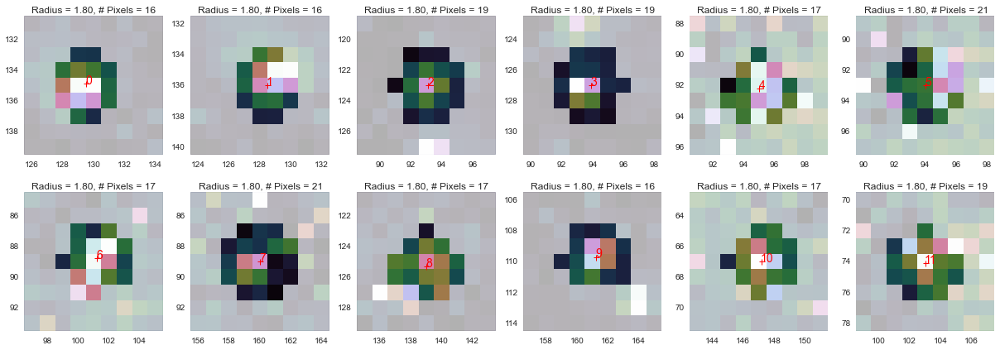

In [37]:
shape2d = (9, 9)
clip_radius = 1.8

nrows = 2
npoints = len(points_patched)
even_npoints = npoints if npoints % 2 == 0 else npoints + 1
ncols = even_npoints // 2

fig, ax = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3.5*nrows))
axr = ax.ravel()
for ip, point in enumerate(points_patched):
    rpoint = np.round(point)
    roi = tt.get_roi_square(rpoint, pad=(shape2d[0]-1)//2)
    axr[ip].imshow(hp_frame[roi], cmap='cubehelix', interpolation='none',
                   extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    axr[ip].plot(point[0], point[1], 'r+')
    axr[ip].annotate('%d' % ip, point, color='red', fontsize=14)
    
    mask = tt.get_roi_circle(point, clip_radius, frame.shape)
    a = np.ones(frame.shape)
    a[mask] = 0
    im = axr[ip].imshow(a[roi], interpolation='none', cmap='gray', vmin=0.5, alpha=0.7,
                        extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    im.cmap.set_under(alpha=0)
    axr[ip].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))

## ROIs for unpatched QDs

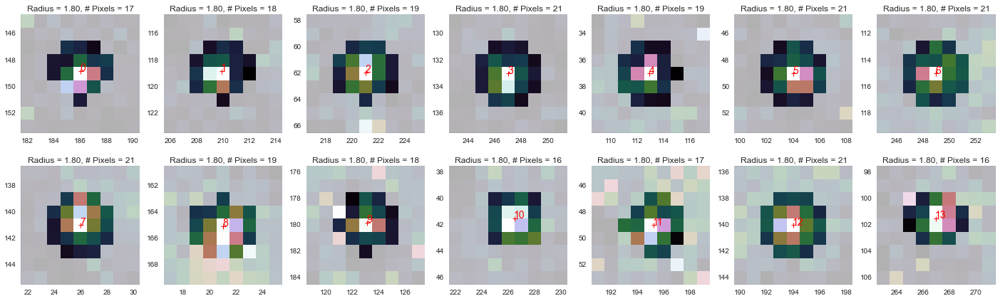

In [38]:
shape2d = (9, 9)
clip_radius = 1.8

nrows = 2
npoints = len(points_unpatched)
even_npoints = npoints if npoints % 2 == 0 else npoints + 1
ncols = even_npoints // 2

fig, ax = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3.5*nrows))
axr = ax.ravel()
for ip, point in enumerate(points_unpatched):
    rpoint = np.round(point)
    roi = tt.get_roi_square(rpoint, pad=(shape2d[0]-1)//2)
    axr[ip].imshow(hp_frame[roi], cmap='cubehelix', interpolation='none',
                   extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    axr[ip].plot(point[0], point[1], 'r+')
    axr[ip].annotate('%d' % ip, point, color='red', fontsize=14)
    
    mask = tt.get_roi_circle(point, clip_radius, frame.shape)
    a = np.ones(frame.shape)
    a[mask] = 0
    im = axr[ip].imshow(a[roi], interpolation='none', cmap='gray', vmin=0.5, alpha=0.7,
                        extent=(roi[1].start-0.5, roi[1].stop-0.5, roi[0].stop-0.5, roi[0].start-0.5))
    im.cmap.set_under(alpha=0)
    axr[ip].set_title('Radius = %.2f, # Pixels = %d' % (clip_radius, len(mask[0])))

# QD Timetraces

In [39]:
colors = sns.color_palette('deep', max(len(points_patched), len(points_unpatched)))

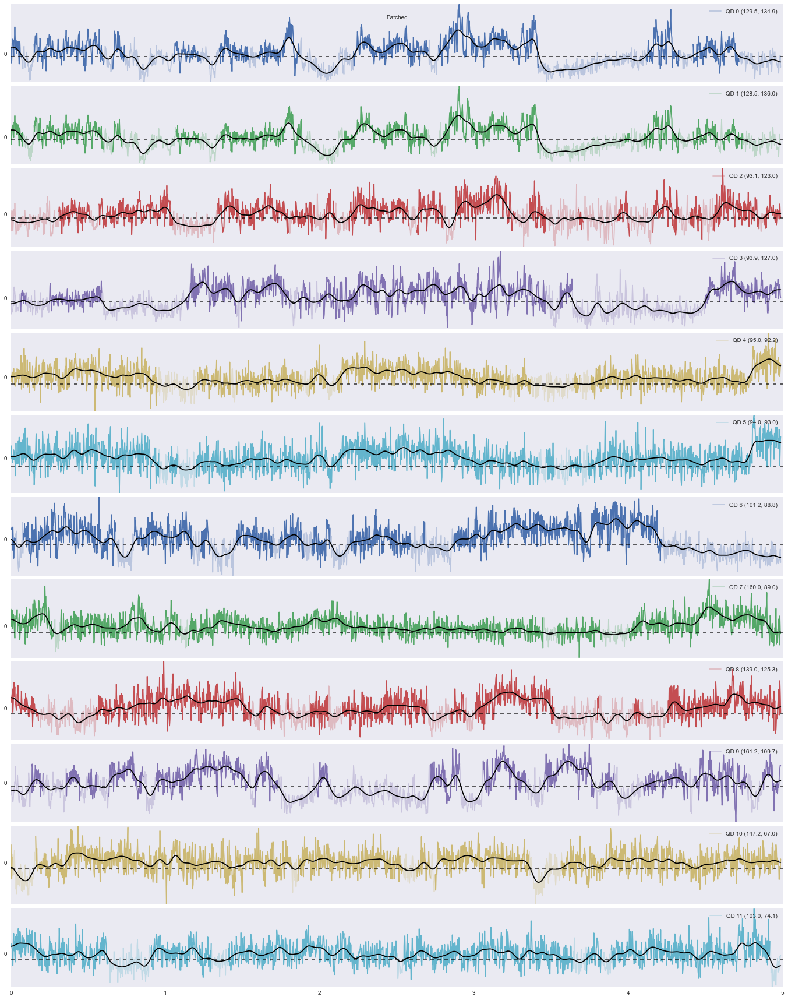

In [40]:
clip_radius = 1.8
detrend_sigma = 300
lowpass_sigma = 10
thresholds = [-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1]

points_sel = points_patched
fig, ax = plt.subplots(len(points_sel), 1, figsize=(20, 2*len(points_sel)), sharex=True)
fig.tight_layout()
fig.suptitle('Patched')
fig.subplots_adjust(left=0.04, right=0.96, hspace=0.05)
for i, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    ftimetrace = ndi.filters.gaussian_filter1d(timetrace, 10)
    on_periods = tt.get_on_periods_slices(timetrace, thresholds[i], lowpass_sigma=lowpass_sigma, align=4)
    
    ax[i].plot(data.time, timetrace, color=colors[i], alpha=0.3,
               label='QD %d (%.1f, %.1f)' % (i, point[0], point[1]))
    for on_period in on_periods:
        ax[i].plot(data.time[on_period], timetrace[on_period], color=colors[i], alpha=1)
    #ax[i].plot(data.time[time_on], trace_on, '.', color=colors[i], alpha=1)
    ax[i].plot(data.time, ftimetrace, color='k')
    ax[i].axhline(thresholds[i], color='k', ls='--', alpha=0.7)
    ax[i].locator_params(axis='y', tight=True, nbins=2)
    ax[i].legend()

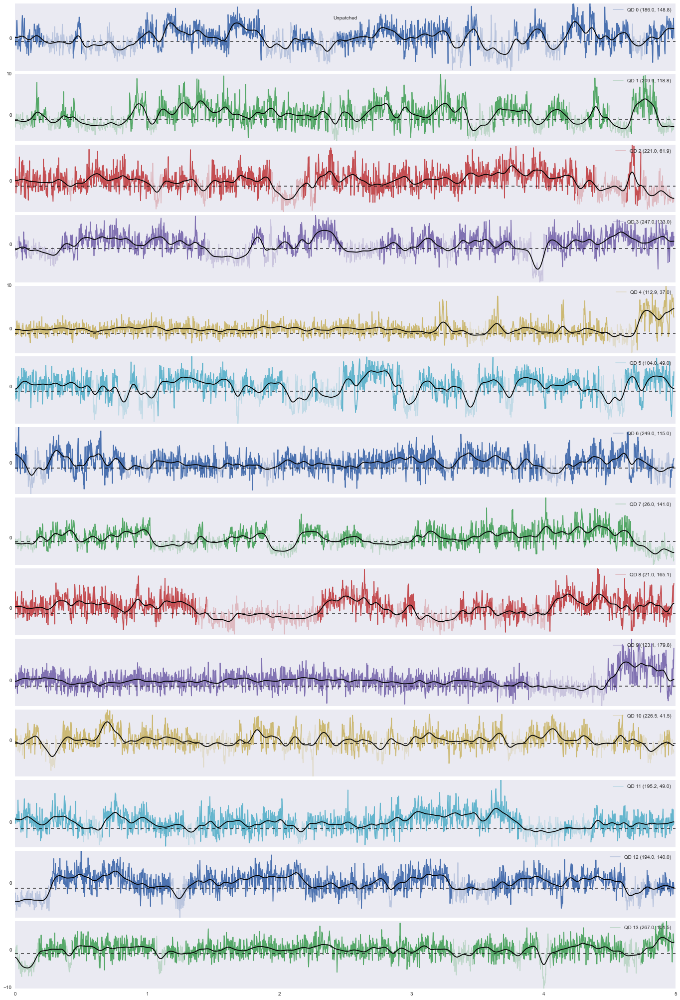

In [41]:
points_sel = points_unpatched

fig, ax = plt.subplots(len(points_sel), 1, figsize=(20, 2*len(points_sel)), sharex=True)
fig.tight_layout()
fig.suptitle('Unpatched')
fig.subplots_adjust(left=0.04, right=0.96, hspace=0.05)
for i, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    ftimetrace = ndi.filters.gaussian_filter1d(timetrace, 10)
    on_periods = tt.get_on_periods_slices(timetrace, thresholds[i], lowpass_sigma=lowpass_sigma, align=4)
    
    ax[i].plot(data.time, timetrace, color=colors[i], alpha=0.3,
               label='QD %d (%.1f, %.1f)' % (i, point[0], point[1]))
    for on_period in on_periods:
        ax[i].plot(data.time[on_period], timetrace[on_period], color=colors[i], alpha=1)
    #ax[i].plot(data.time[time_on], trace_on, '.', color=colors[i], alpha=1)
    ax[i].plot(data.time, ftimetrace, color='k')
    ax[i].axhline(thresholds[i], color='k', ls='--', alpha=0.7)
    ax[i].locator_params(axis='y', tight=True, nbins=2)
    ax[i].legend()

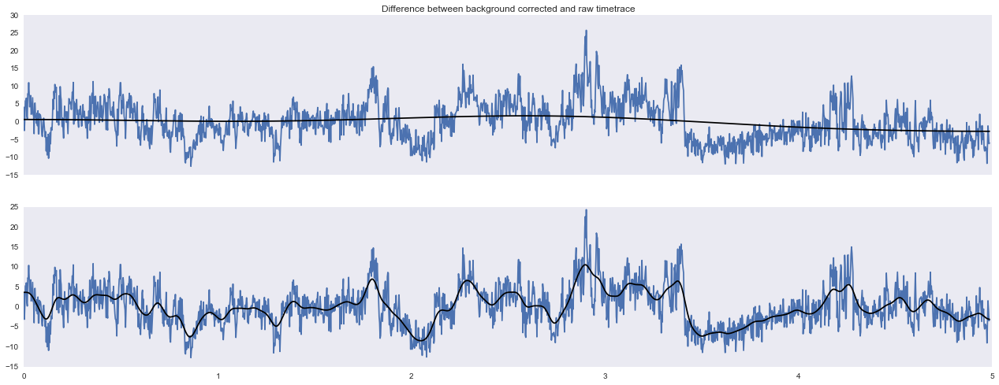

In [42]:
point = points_patched[1]

fig, ax = plt.subplots(2, 1, figsize=(22, 8), sharex=True)
timetrace1 = tt.get_timetrace(data.video, point, clip_radius=clip_radius, detrend_sigma=None)
trend = ndi.filters.gaussian_filter1d(timetrace1, detrend_sigma)
ftimetrace = ndi.filters.gaussian_filter1d(timetrace1 -  trend, lowpass_sigma)
ax[0].plot(data.time, timetrace1, label='QD (%.1f, %.1f)' % point);
ax[0].plot(data.time, trend, color='k');
ax[1].plot(data.time, timetrace1 - trend, label='QD (%.1f, %.1f)' % point);
ax[1].plot(data.time, ftimetrace, color='k');
ax[0].set_title('Difference between background corrected and raw timetrace');

# Fluorescence alternation analysis

## Signal: Alternated differences

Given a timetrace $\{t_k\}$, where $t_k$ is the ROI-average in the $k$-th frame, the signal is compute as follows:

1. compute the 2-frame average timetrace $\{t'_i\}$, where $t'_i = (t_{2i} + t_{2i + 1})/2$
2. compute $\{d_1, d_2, d_3, d_4, ...\} = \{(t'_0 - t'_1),\; -(t'_2 - t'_1),\; (t'_3 - t'_2),\; -(t'_4 - t'_3)....\}$, which is the finite-difference with alternated sign. 
3. for the out-of-phase case, points (1) and (2) are repeated dropping the first element from $\{t_k\}$

> This signal is computed by functions `tt.edge_diff_all()`.

## N-elements averages

The *n*-cycles average is computed as a *n*-elements running (or block) average on the array $\{d_i\}$.

### Implementation

Call `tt.avg_nsamples()` passing the array $\{d_i\}$ previously computed via `tt.edge_diff_all()` ([see definition](# Signal: Alternated differences)). 


## Simulated test signal

In [43]:
f0 = 100
sim_signal = 1 + np.cos(2*np.pi*f0*data.time - np.pi/4)

In [44]:
sns.set_style('darkgrid')

## 1-period Mean, Std, SNR

In [45]:
ncycles = 2   # --> 2 sample average is 1 alternation period
running_avg = False
clip_radius = 1.8
detrend_sigma = 300

In [46]:
patched = True

if patched:
    points_sel = points_patched
else:
    points_sel = points_unpatched

n_mean_diff, n_mean_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
n_std_diff, n_std_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
timetrace_mean = np.zeros(len(points_sel))
for ip, point in enumerate(points_sel):
    timetrace, timetrace_mean[ip] = tt.get_timetrace(
        data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma, return_mean=True)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    all_diff = tt.edge_diff_all(timetrace_on)
    all_diffo = tt.edge_diff_all(timetrace_on, offset=1)
    n_all_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)
    n_all_diffo = tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg)

    n_mean_diff[ip], n_mean_diffo[ip] = n_all_diff.mean(), n_all_diffo.mean()
    n_std_diff[ip], n_std_diffo[ip] = n_all_diff.std(), n_all_diffo.std()

name = '%d-cycles avg of alternated diff' % ncycles
fig, ax = plt.subplots(1, 4, figsize=(24, 4))
ax[0].plot(n_mean_diff, '-o', mew=0, ms=6, label='in-phase')
ax[0].plot(n_mean_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[0].set_title('Mean of (%s)' % name)
ax[1].plot(n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[1].plot(n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[1].set_title('Std.Dev. of (%s)' % name)
ax[2].plot(n_mean_diff/n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[2].plot(n_mean_diffo/n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[2].set_title('SNR of (%s)' % name)
ax[3].plot(n_mean_diff/timetrace_mean*100, '-o', mew=0, ms=6, label='in-phase')
ax[3].plot(n_mean_diffo/timetrace_mean*100, '-o', mew=0, ms=6, label='out-of-phase')
ax[3].set_ylabel('Percentage (%)')
ax[3].set_title('Signal / mean(timetrace)')
ax[1].set_xlabel('Quantum Dot')
ax[3].legend(ncol=2)
plt.close(fig)
if patched:
    fig.suptitle('Patched, %d-cycles average' % ncycles);
    fig_patched = fig
else:
    fig.suptitle('Unpatched, %d-cycles average' % ncycles);
    fig_unpatched = fig

In [47]:
patched = False

if patched:
    points_sel = points_patched
else:
    points_sel = points_unpatched

n_mean_diff, n_mean_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
n_std_diff, n_std_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
timetrace_mean = np.zeros(len(points_sel))
for ip, point in enumerate(points_sel):
    timetrace, timetrace_mean[ip] = tt.get_timetrace(
        data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma, return_mean=True)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    all_diff = tt.edge_diff_all(timetrace_on)
    all_diffo = tt.edge_diff_all(timetrace_on, offset=1)
    n_all_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)
    n_all_diffo = tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg)

    n_mean_diff[ip], n_mean_diffo[ip] = n_all_diff.mean(), n_all_diffo.mean()
    n_std_diff[ip], n_std_diffo[ip] = n_all_diff.std(), n_all_diffo.std()

name = '%d-cycles avg of alternated diff' % ncycles
fig, ax = plt.subplots(1, 4, figsize=(24, 4))
ax[0].plot(n_mean_diff, '-o', mew=0, ms=6, label='in-phase')
ax[0].plot(n_mean_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[0].set_title('Mean of (%s)' % name)
ax[1].plot(n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[1].plot(n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[1].set_title('Std.Dev. of (%s)' % name)
ax[2].plot(n_mean_diff/n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[2].plot(n_mean_diffo/n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[2].set_title('SNR of (%s)' % name)
ax[3].plot(n_mean_diff/timetrace_mean*100, '-o', mew=0, ms=6, label='in-phase')
ax[3].plot(n_mean_diffo/timetrace_mean*100, '-o', mew=0, ms=6, label='out-of-phase')
ax[3].set_ylabel('Percentage (%)')
ax[3].set_title('Signal / mean(timetrace)')
ax[1].set_xlabel('Quantum Dot')
ax[3].legend(ncol=2)
plt.close(fig)
if patched:
    fig.suptitle('Patched, %d-cycles average' % ncycles);
    fig_patched = fig
else:
    fig.suptitle('Unpatched, %d-cycles average' % ncycles);
    fig_unpatched = fig

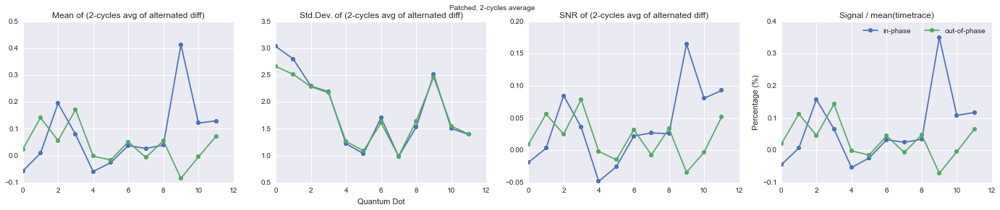

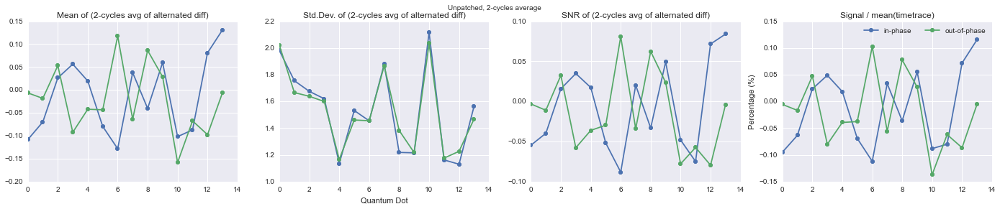

In [48]:
display(fig_patched)
display(fig_unpatched)

### Figure caption
Using [the previous definition of signal](#Signal:-Alternated-differences) the figure shows:

- (*column 1*) $\textrm{mean}(\{d_i\})$
- (*column 2*) $\textrm{std_dev}(\{d_i\})$
- (*column 3*) $\textrm{mean}(\{d_i\})/\textrm{std_dev}(\{d_i\})$
- (*column 4*) $\textrm{mean}(\{d_i\})/\textrm{mean}(\{t_k\})$

## N-period Mean, Std, SNR

In [49]:
sns.set_style('darkgrid')
sns.set_context('notebook', font_scale=1.2)

In [50]:
ncycles = 16
running_avg = False
clip_radius = 1.8
detrend_sigma = 300

In [51]:
patched = True

if patched:
    points_sel = points_patched
else:
    points_sel = points_unpatched

n_mean_diff, n_mean_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
n_std_diff, n_std_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
timetrace_mean = np.zeros(len(points_sel))
for ip, point in enumerate(points_sel):
    timetrace, timetrace_mean[ip] = tt.get_timetrace(
        data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma, return_mean=True)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    all_diff = tt.edge_diff_all(timetrace_on)
    all_diffo = tt.edge_diff_all(timetrace_on, offset=1)
    n_all_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)
    n_all_diffo = tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg)

    n_mean_diff[ip], n_mean_diffo[ip] = n_all_diff.mean(), n_all_diffo.mean()
    n_std_diff[ip], n_std_diffo[ip] = n_all_diff.std(), n_all_diffo.std()

name = '%d-cycles avg of alternated diff' % ncycles
fig, ax = plt.subplots(1, 4, figsize=(24, 4))
ax[0].plot(n_mean_diff, '-o', mew=0, ms=6, label='in-phase')
ax[0].plot(n_mean_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[0].set_title('Mean of (%s)' % name)
ax[1].plot(n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[1].plot(n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[1].set_title('Std.Dev. of (%s)' % name)
ax[2].plot(n_mean_diff/n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[2].plot(n_mean_diffo/n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[2].set_title('SNR of (%s)' % name)
ax[3].plot(n_mean_diff/timetrace_mean*100, '-o', mew=0, ms=6, label='in-phase')
ax[3].plot(n_mean_diffo/timetrace_mean*100, '-o', mew=0, ms=6, label='out-of-phase')
ax[3].set_ylabel('Percentage (%)')
ax[3].set_title('Mean signal / mean(timetrace)')
ax[1].set_xlabel('Quantum Dot')
ax[3].legend(ncol=2)
ax[3].set_ylim(-0.3, 0.3)
plt.close(fig)
if patched:
    fig.suptitle('Patched, %d-cycles average' % ncycles);
    fig_patched = fig
else:
    fig.suptitle('Unpatched, %d-cycles average' % ncycles);
    fig_unpatched = fig

In [52]:
patched = False

if patched:
    points_sel = points_patched
else:
    points_sel = points_unpatched

n_mean_diff, n_mean_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
n_std_diff, n_std_diffo = np.zeros(len(points_sel)), np.zeros(len(points_sel))
timetrace_mean = np.zeros(len(points_sel))
for ip, point in enumerate(points_sel):
    timetrace, timetrace_mean[ip] = tt.get_timetrace(
        data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma, return_mean=True)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    all_diff = tt.edge_diff_all(timetrace_on)
    all_diffo = tt.edge_diff_all(timetrace_on, offset=1)
    n_all_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)
    n_all_diffo = tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg)

    n_mean_diff[ip], n_mean_diffo[ip] = n_all_diff.mean(), n_all_diffo.mean()
    n_std_diff[ip], n_std_diffo[ip] = n_all_diff.std(), n_all_diffo.std()

name = '%d-cycles avg of alternated diff' % ncycles
fig, ax = plt.subplots(1, 4, figsize=(24, 4))
ax[0].plot(n_mean_diff, '-o', mew=0, ms=6, label='in-phase')
ax[0].plot(n_mean_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[0].set_title('Mean of (%s)' % name)
ax[1].plot(n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[1].plot(n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[1].set_title('Std.Dev. of (%s)' % name)
ax[2].plot(n_mean_diff/n_std_diff, '-o', mew=0, ms=6, label='in-phase')
ax[2].plot(n_mean_diffo/n_std_diffo, '-o', mew=0, ms=6, label='out-of-phase')
ax[2].set_title('SNR of (%s)' % name)
ax[3].plot(n_mean_diff/timetrace_mean*100, '-o', mew=0, ms=6, label='in-phase')
ax[3].plot(n_mean_diffo/timetrace_mean*100, '-o', mew=0, ms=6, label='out-of-phase')
ax[3].set_ylabel('Percentage (%)')
ax[3].set_title('Mean signal / mean(timetrace)')
ax[1].set_xlabel('Quantum Dot')
ax[3].legend(ncol=2)
ax[3].set_ylim(-0.3, 0.3)
plt.close(fig)
if patched:
    fig.suptitle('Patched, %d-cycles average' % ncycles);
    fig_patched = fig
else:
    fig.suptitle('Unpatched, %d-cycles average' % ncycles);
    fig_unpatched = fig

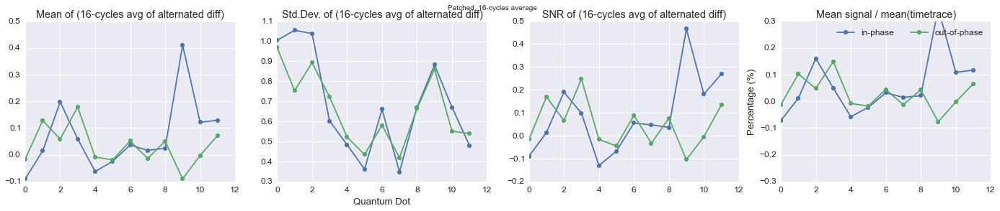

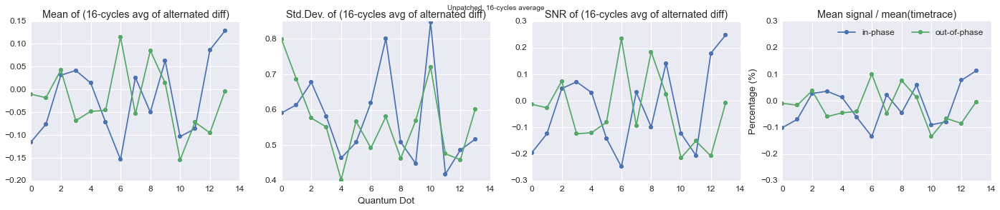

In [53]:
display(fig_patched)
display(fig_unpatched)

### N-periods average figure caption

We compute the signal $\{d_i\}$ as the alternated differenes as [the previously defined](#Signal:-Alternated-differences). Then we $\{r_i\}$ as the running average of $\{d_i\}$ using `ncycles` samples window.
With this definition the figure columns shows

- (*column 1*) $\textrm{mean}(\{r_i\})$
- (*column 2*) $\textrm{std_dev}(\{r_i\})$
- (*column 3*) $\textrm{mean}(\{r_i\})/\textrm{std_dev}(\{d_i\})$
- (*column 4*) $\textrm{mean}(\{r_i\})/\textrm{mean}(\{t_k\})$

The results obtained with the running average are in line with the [previous plot](#1-period-Mean,-Std,-SNR) where no running average was performed.


# Signal vs time

In [54]:
def t_run(sample_diff, num_samples, running_avg):
    if running_avg:
        return np.arange(0, sample_diff.size)*2 + 0.5 + num_samples
    else:
        return np.arange(0, sample_diff.size)*2*num_samples + num_samples

In [55]:
points_sel = points_patched
ncycles = 8
running_avg = True
clip_radius = 1.8
detrend_sigma = 300

n_alt_diff, n_alt_diffo = [], []
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace += 0.5*sim_signal
    timetrace_on = timetrace
    #time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    n_alt_diff.append(
        tt.avg_nsamples(tt.edge_diff_all(timetrace, offset=0), 
                        num_samples=ncycles, running_avg=running_avg))
    n_alt_diffo.append(
        tt.avg_nsamples(tt.edge_diff_all(timetrace, offset=1), 
                        num_samples=ncycles, running_avg=running_avg))
        
alpha = 0.8
name = '%d-cycles avg of 2-edges sum' % ncycles
fig, ax = plt.subplots(len(points_sel), 1, 
                       figsize=(18, 4*len(points_sel)),
                       sharex=False)
fig.tight_layout()
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    signal_clue = n_alt_diff[ip]**2
    signal_clueo = n_alt_diffo[ip]**2
    ax[ip].plot(t_run(signal_clue, ncycles, running_avg), 
                signal_clue, label='QD %d: signal^2 (%d cycles) in-phase' % (ip, ncycles), alpha=alpha)
    ax[ip].plot(t_run(signal_clueo, ncycles, running_avg), 
                signal_clueo, label='QD %d: signal^2 (%d cycles) out-of-phase' % (ip, ncycles), alpha=alpha)

    ax2 = ax[ip].twinx()
    ax2.grid(False)
    ax2.plot(timetrace, 'k', alpha=0.3)
    ax2.set_ylim(-40)

    ax[0].set_title('Patched: %d-cycles average' % ncycles)
    ax[ip].legend(loc='upper left')
    #ax[ip].set_ylim(-0, 20)
plt.close(fig)
fig_patched = fig;

In [56]:
points_sel = points_unpatched

n_alt_diff, n_alt_diffo = [], []
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    timetrace_on = timetrace
    #time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    n_alt_diff.append(
        tt.avg_nsamples(tt.edge_diff_all(timetrace, offset=0), 
                        num_samples=ncycles, running_avg=running_avg))
    n_alt_diffo.append(
        tt.avg_nsamples(tt.edge_diff_all(timetrace, offset=1), 
                        num_samples=ncycles, running_avg=running_avg))
        

fig, ax = plt.subplots(len(points_sel), 1, 
                       figsize=(18, 4*len(points_sel)),
                       sharex=False)
fig.tight_layout()
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    signal_clue = n_alt_diff[ip]**2 
    signal_clueo = n_alt_diffo[ip]**2
    ax[ip].plot(t_run(signal_clue, ncycles, running_avg), 
                signal_clue, label='QD %d: signal^2 (%d cycles) in-phase' % (ip, ncycles), alpha=alpha)
    ax[ip].plot(t_run(signal_clueo, ncycles, running_avg), 
                signal_clueo, label='QD %d: signal^2 (%d cycles) out-of-phase' % (ip, ncycles), alpha=alpha)
    
    ax2 = ax[ip].twinx()
    ax2.grid(False)
    ax2.plot(timetrace, 'k', alpha=0.3)
    ax2.set_ylim(-40)

    ax[0].set_title('Unpatched: %d-cycles average' % ncycles)
    ax[ip].legend(loc='upper left')
    #ax[ip].set_ylim(-0, 20)
plt.close(fig)
fig_unpatched = fig;

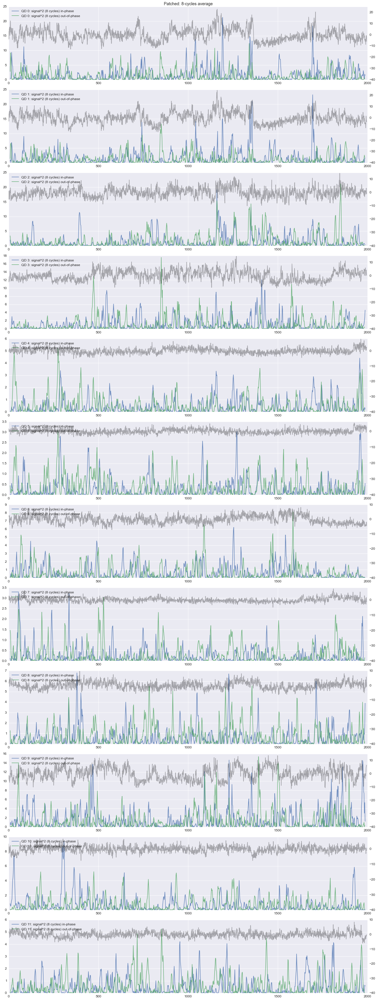

In [57]:
fig_patched

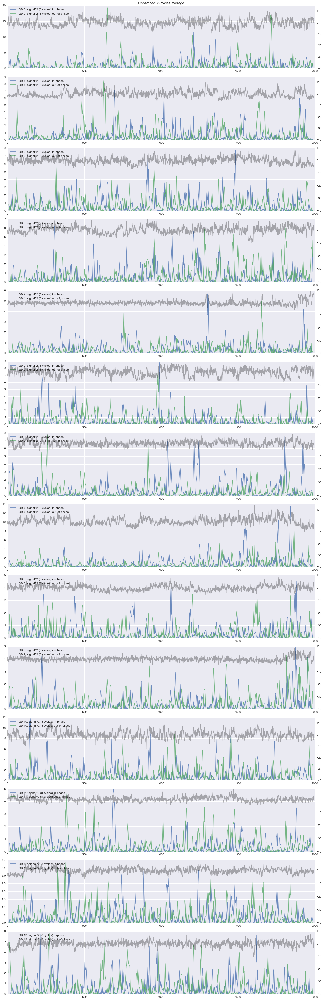

In [58]:
fig_unpatched

# Signal vs time: burst search

In [59]:
from burstsearch import burstsearch_py
from timetraces import t_diffall, t_ravg

## QD selection for burst search

Quick references for QD selection:

- Selection of [QD on patched cell](#QD-on-patched-cell)
- [QD timetraces](#QD-Timetraces)
- [N-periods-average-figure-caption](#N-periods-average-figure-caption)

In [60]:
ipoints_patched = [i for i in range(len(points_patched)) if i not in (3, 9, 10, 11)]#[0, 2, 3, 9]
ipoints_unpatched = [i for i in range(len(points_unpatched)) if i not in (4, 6, 9)]

In [61]:
fraction = 0.6    # fraction of max signal to use as threhsold
bs_threshold = 4
ncycles = 12
pad = 5
running_avg = True

## Patched in-phase

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_inphase QD 0 (129, 134).png

Patched_inphase QD 0 Number of bursts: 3


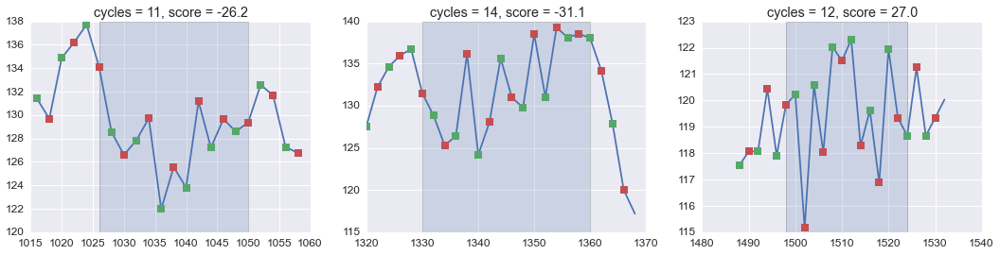

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_inphase QD 1 (128, 136).png

Patched_inphase QD 1 Number of bursts: 1


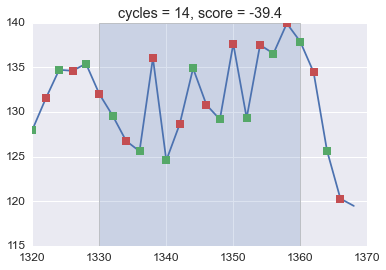

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_inphase QD 2 (93, 123).png

Patched_inphase QD 2 Number of bursts: 2


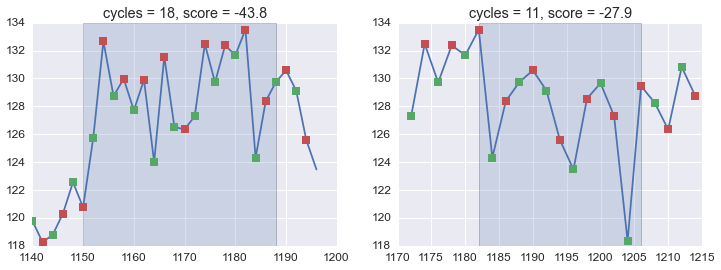

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_inphase QD 4 (95, 92).png

Patched_inphase QD 4 Number of bursts: 8


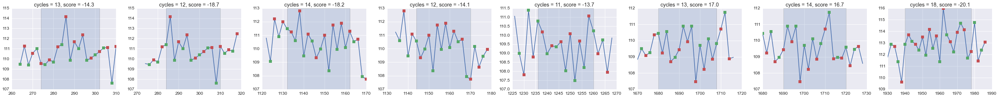

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_inphase QD 5 (94, 93).png

Patched_inphase QD 5 Number of bursts: 8


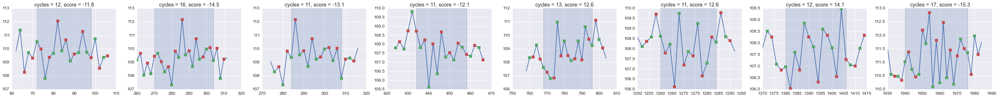

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_inphase QD 6 (101, 88).png

Patched_inphase QD 6 Number of bursts: 14


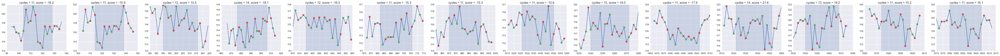

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_inphase QD 7 (160, 89).png

Patched_inphase QD 7 Number of bursts: 1


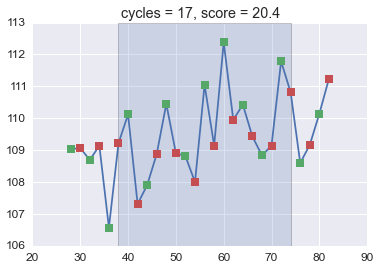

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_inphase QD 8 (139, 125).png

Patched_inphase QD 8 Number of bursts: 3


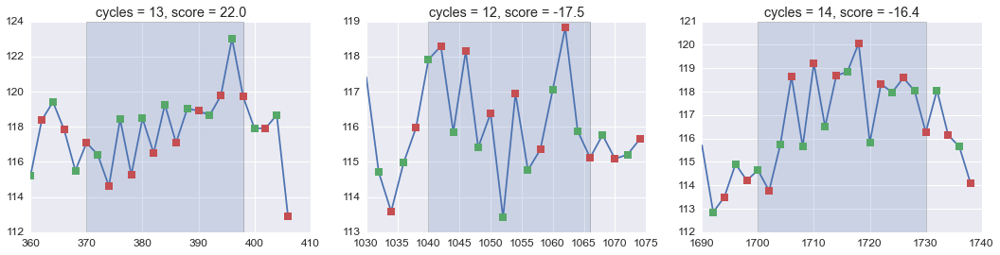

In [62]:
patched = True
inphase = True

label = 'Patched' if patched else 'Unpatched'
if inphase: label += '_inphase'
else: label += '_outphase'
points_sel = points_patched if patched else points_unpatched
ipoints = ipoints_patched if patched else ipoints_unpatched
offset = int(not inphase)

bursts_qd = []
for ipoint in ipoints:
    point = points_sel[ipoint]

    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    timetracem = tt.avg_nsamples(timetracer, 2, running_avg=False, offset=offset)
    t_timetrace = np.arange(timetrace.size)
    t_timetracem = np.arange(timetracem.size)*2 + offset
    t_ra = t_ravg(timetrace.size, inphase=inphase, num_samples=ncycles)
    t_da = t_diffall(timetrace.size, inphase=inphase)
    
    all_diff = tt.edge_diff_all(timetrace, offset=offset)
    rall_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)

    signal = all_diff/np.abs(timetracer.mean())*1e2
    score2 = rall_diff/np.abs(timetracer.mean())*1e2
    
    if fraction is not None:
        bs_threshold = (score2**2).max()*fraction
    bursts, score = burstsearch_py(signal, m=ncycles, threshold=bs_threshold, debug=True)
    assert np.allclose(score, score2)
    assert bursts.shape[0] < 20
    bursts_qd.append(bursts)

    fig, ax = plt.subplots(figsize=(200, 4))
    ax.plot(t_timetracem, timetracem, 'k', alpha=0.2)
    ax.plot(t_timetracem[::2], timetracem[::2], 'sg')
    ax.plot(t_timetracem[1::2], timetracem[1::2], 'sr')
    ax.set_ylim(ax.get_ylim()[0]*0.95)
    ax2 = ax.twinx()
    ax2.grid(False)
    ax2.plot(t_ra, score**2)
    for b in bursts:
        ax.axvspan(t_da[b['start']], t_da[b['stop']], alpha=0.15)

    name = 'figures/%s Full Timetrace %s QD %d (%d, %d).png' % (dataset_label, label, ipoint, point[0], point[1])
    plt.savefig(name, bbox_inches='tight')
    plt.close(fig)
    display(FileLink(name))
    print('%s QD %d Number of bursts: %d' % (label, ipoint, bursts.shape[0]))
    
    if bursts.shape[0] > 0:
        itm_start = bursts.start
        itm_stop = bursts.stop + 1

        width_ms = 1e3*((bursts.stop + 1 - bursts.start)*2/400)
        v_on = slice(None, None, 2)
        v_off = slice(1, None, 2)
        fig, ax = plt.subplots(1, bursts.shape[0], figsize=(6*bursts.shape[0], 4), squeeze=False)
        for i in range(bursts.shape[0]):
            pstart = itm_start[i] - pad
            pstop = itm_stop[i] + pad
            pstart = np.clip(pstart, 0, t_timetracem.size - 1)
            pstop = np.clip(pstop, 0, t_timetracem.size - 1)

            tm_on_start = np.nonzero(t_timetracem[v_on] >= t_timetracem[pstart])[0][0]
            tm_on_stop = np.nonzero(t_timetracem[v_on] <= t_timetracem[pstop])[0][-1]
            tm_off_start = np.nonzero(t_timetracem[v_off] >= t_timetracem[pstart])[0][0]
            tm_off_stop = np.nonzero(t_timetracem[v_off] <= t_timetracem[pstop])[0][-1]

            ax[0,i].plot(t_timetracem[pstart:pstop], timetracem[pstart:pstop], '-')
            ax[0,i].plot(t_timetracem[v_on][tm_on_start:tm_on_stop], timetracem[v_on][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].plot(t_timetracem[v_off][tm_on_start:tm_on_stop], timetracem[v_off][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].axvspan(t_timetracem[itm_start[i]], t_timetracem[itm_stop[i]], alpha=0.2, linewidth=1)

            ax[0,i].set_title('cycles = %d, score = %.1f' % (bursts.stop[i] - bursts.start[i], bursts.score[i]))
        plt.close(fig)
        display(fig)
        
if patched and inphase:
    bursts_qd_patched = bursts_qd
elif patched and not inphase:
    bursts_qd_patchedo = bursts_qd
elif not patched and inphase:
    bursts_qd_unpatched = bursts_qd
elif not patched and not inphase:
    bursts_qd_unpatchedo = bursts_qd

## Patched out-phase

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_outphase QD 0 (129, 134).png

Patched_outphase QD 0 Number of bursts: 9


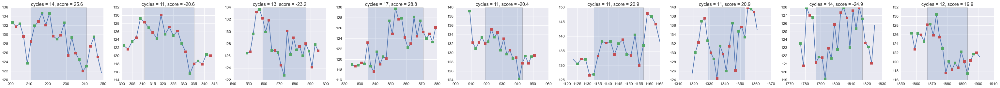

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_outphase QD 1 (128, 136).png

Patched_outphase QD 1 Number of bursts: 6


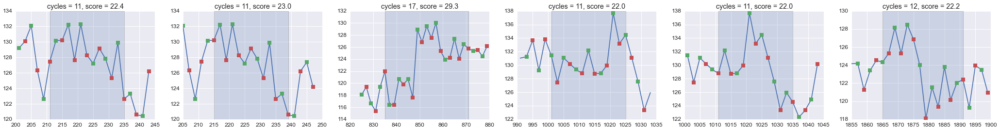

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_outphase QD 2 (93, 123).png

Patched_outphase QD 2 Number of bursts: 3


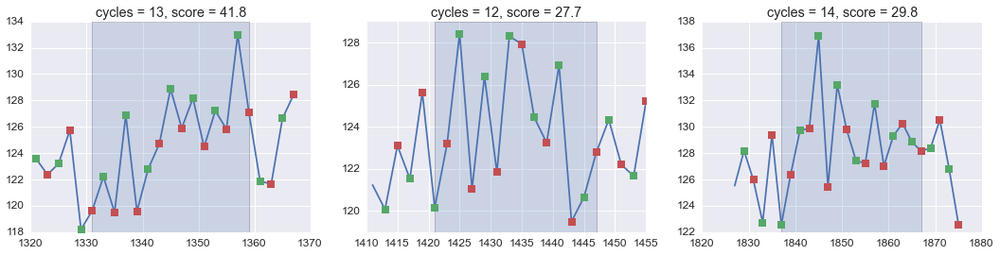

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_outphase QD 4 (95, 92).png

Patched_outphase QD 4 Number of bursts: 3


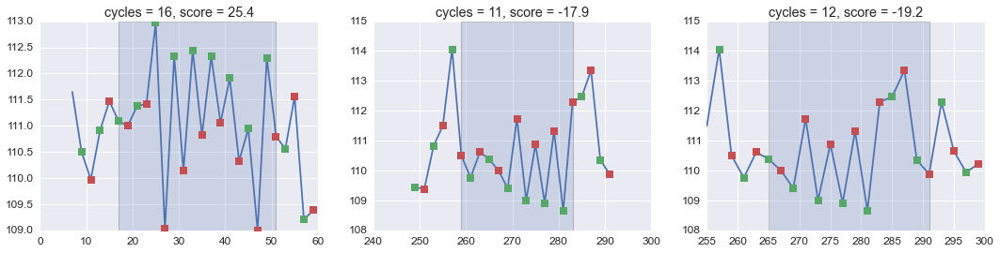

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_outphase QD 5 (94, 93).png

Patched_outphase QD 5 Number of bursts: 8


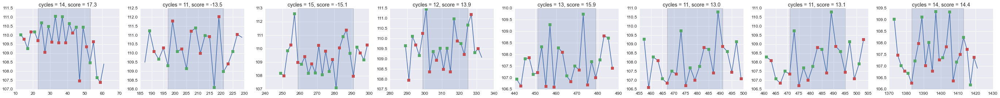

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_outphase QD 6 (101, 88).png

Patched_outphase QD 6 Number of bursts: 5


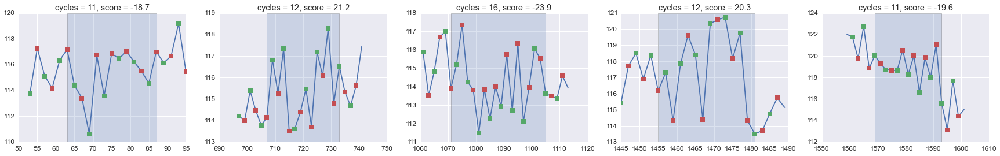

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_outphase QD 7 (160, 89).png

Patched_outphase QD 7 Number of bursts: 6


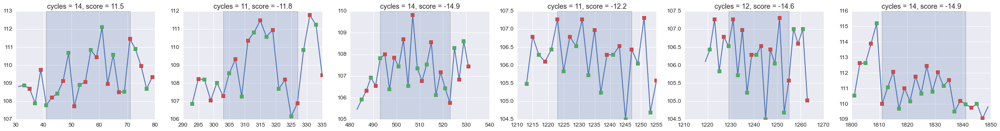

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Patched_outphase QD 8 (139, 125).png

Patched_outphase QD 8 Number of bursts: 16


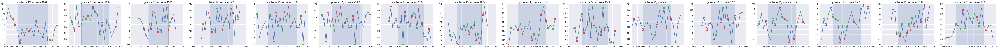

In [63]:
patched = True
inphase = False

label = 'Patched' if patched else 'Unpatched'
if inphase: label += '_inphase'
else: label += '_outphase'
points_sel = points_patched if patched else points_unpatched
ipoints = ipoints_patched if patched else ipoints_unpatched
offset = int(not inphase)

bursts_qd = []
for ipoint in ipoints:
    point = points_sel[ipoint]

    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    timetracem = tt.avg_nsamples(timetracer, 2, running_avg=False, offset=offset)
    t_timetrace = np.arange(timetrace.size)
    t_timetracem = np.arange(timetracem.size)*2 + offset
    t_ra = t_ravg(timetrace.size, inphase=inphase, num_samples=ncycles)
    t_da = t_diffall(timetrace.size, inphase=inphase)
    
    all_diff = tt.edge_diff_all(timetrace, offset=offset)
    rall_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)

    signal = all_diff/np.abs(timetracer.mean())*1e2
    score2 = rall_diff/np.abs(timetracer.mean())*1e2
    
    if fraction is not None:
        bs_threshold = (score2**2).max()*fraction
    bursts, score = burstsearch_py(signal, m=ncycles, threshold=bs_threshold, debug=True)
    assert np.allclose(score, score2)
    assert bursts.shape[0] < 20
    bursts_qd.append(bursts)

    fig, ax = plt.subplots(figsize=(200, 4))
    ax.plot(t_timetracem, timetracem, 'k', alpha=0.2)
    ax.plot(t_timetracem[::2], timetracem[::2], 'sg')
    ax.plot(t_timetracem[1::2], timetracem[1::2], 'sr')
    ax.set_ylim(ax.get_ylim()[0]*0.95)
    ax2 = ax.twinx()
    ax2.grid(False)
    ax2.plot(t_ra, score**2)
    for b in bursts:
        ax.axvspan(t_da[b['start']], t_da[b['stop']], alpha=0.15)

    name = 'figures/%s Full Timetrace %s QD %d (%d, %d).png' % (dataset_label, label, ipoint, point[0], point[1])
    plt.savefig(name, bbox_inches='tight')
    plt.close(fig)
    display(FileLink(name))
    print('%s QD %d Number of bursts: %d' % (label, ipoint, bursts.shape[0]))
    
    if bursts.shape[0] > 0:
        itm_start = bursts.start
        itm_stop = bursts.stop + 1

        width_ms = 1e3*((bursts.stop + 1 - bursts.start)*2/400)
        v_on = slice(None, None, 2)
        v_off = slice(1, None, 2)
        fig, ax = plt.subplots(1, bursts.shape[0], figsize=(6*bursts.shape[0], 4), squeeze=False)
        for i in range(bursts.shape[0]):
            pstart = itm_start[i] - pad
            pstop = itm_stop[i] + pad
            pstart = np.clip(pstart, 0, t_timetracem.size - 1)
            pstop = np.clip(pstop, 0, t_timetracem.size - 1)

            tm_on_start = np.nonzero(t_timetracem[v_on] >= t_timetracem[pstart])[0][0]
            tm_on_stop = np.nonzero(t_timetracem[v_on] <= t_timetracem[pstop])[0][-1]
            tm_off_start = np.nonzero(t_timetracem[v_off] >= t_timetracem[pstart])[0][0]
            tm_off_stop = np.nonzero(t_timetracem[v_off] <= t_timetracem[pstop])[0][-1]

            ax[0,i].plot(t_timetracem[pstart:pstop], timetracem[pstart:pstop], '-')
            ax[0,i].plot(t_timetracem[v_on][tm_on_start:tm_on_stop], timetracem[v_on][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].plot(t_timetracem[v_off][tm_on_start:tm_on_stop], timetracem[v_off][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].axvspan(t_timetracem[itm_start[i]], t_timetracem[itm_stop[i]], alpha=0.2, linewidth=1)

            ax[0,i].set_title('cycles = %d, score = %.1f' % (bursts.stop[i] - bursts.start[i], bursts.score[i]))
        plt.close(fig)
        display(fig)
if patched and inphase:
    bursts_qd_patched = bursts_qd
elif patched and not inphase:
    bursts_qd_patchedo = bursts_qd
elif not patched and inphase:
    bursts_qd_unpatched = bursts_qd
elif not patched and not inphase:
    bursts_qd_unpatchedo = bursts_qd

## Unpatched in-phase

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_inphase QD 0 (186, 148).png

Unpatched_inphase QD 0 Number of bursts: 15


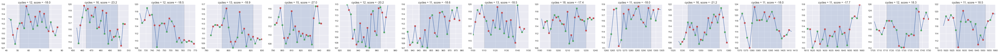

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_inphase QD 1 (209, 118).png

Unpatched_inphase QD 1 Number of bursts: 10


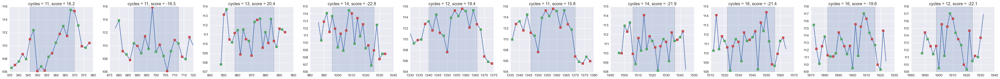

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_inphase QD 2 (221, 61).png

Unpatched_inphase QD 2 Number of bursts: 7


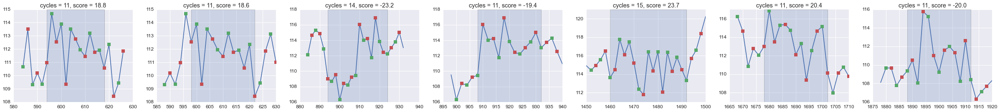

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_inphase QD 3 (247, 133).png

Unpatched_inphase QD 3 Number of bursts: 7


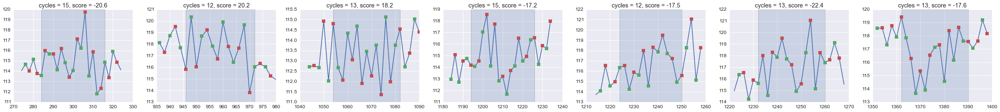

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_inphase QD 5 (104, 49).png

Unpatched_inphase QD 5 Number of bursts: 6


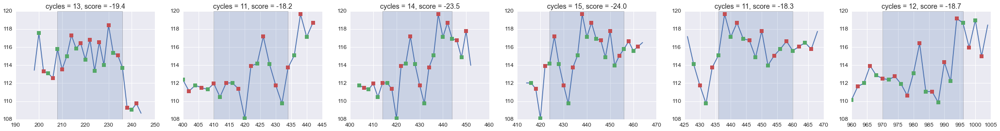

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_inphase QD 7 (26, 141).png

Unpatched_inphase QD 7 Number of bursts: 4


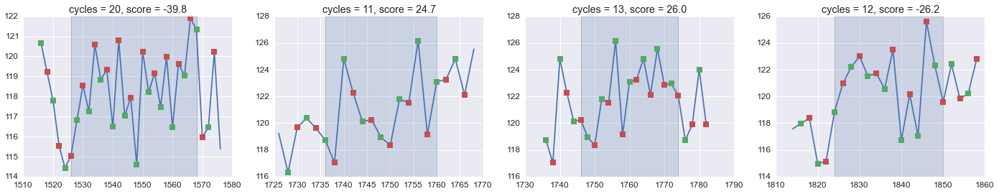

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_inphase QD 8 (21, 165).png

Unpatched_inphase QD 8 Number of bursts: 7


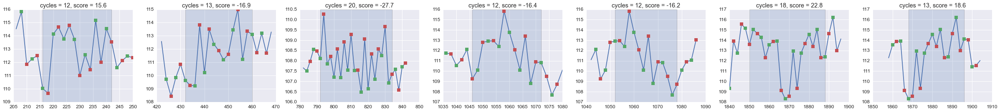

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_inphase QD 10 (226, 41).png

Unpatched_inphase QD 10 Number of bursts: 4


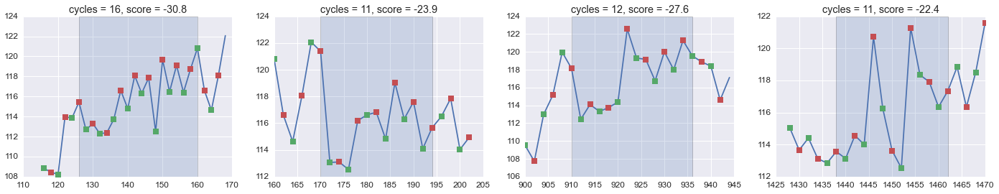

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_inphase QD 11 (195, 49).png

Unpatched_inphase QD 11 Number of bursts: 1


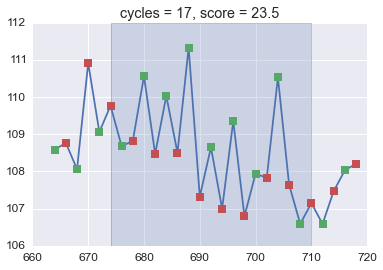

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_inphase QD 12 (194, 140).png

Unpatched_inphase QD 12 Number of bursts: 4


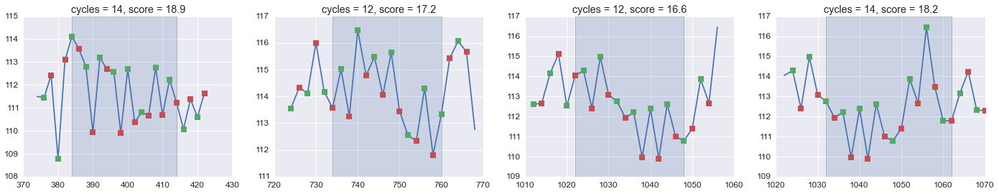

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_inphase QD 13 (267, 101).png

Unpatched_inphase QD 13 Number of bursts: 16


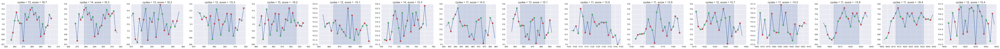

In [64]:
patched = False
inphase = True

label = 'Patched' if patched else 'Unpatched'
if inphase: label += '_inphase'
else: label += '_outphase'
points_sel = points_patched if patched else points_unpatched
ipoints = ipoints_patched if patched else ipoints_unpatched
offset = int(not inphase)

bursts_qd = []
for ipoint in ipoints:
    point = points_sel[ipoint]

    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    timetracem = tt.avg_nsamples(timetracer, 2, running_avg=False, offset=offset)
    t_timetrace = np.arange(timetrace.size)
    t_timetracem = np.arange(timetracem.size)*2 + offset
    t_ra = t_ravg(timetrace.size, inphase=inphase, num_samples=ncycles)
    t_da = t_diffall(timetrace.size, inphase=inphase)
    
    all_diff = tt.edge_diff_all(timetrace, offset=offset)
    rall_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)

    signal = all_diff/np.abs(timetracer.mean())*1e2
    score2 = rall_diff/np.abs(timetracer.mean())*1e2
    
    if fraction is not None:
        bs_threshold = (score2**2).max()*fraction
    bursts, score = burstsearch_py(signal, m=ncycles, threshold=bs_threshold, debug=True)
    assert np.allclose(score, score2)
    assert bursts.shape[0] < 20
    bursts_qd.append(bursts)

    fig, ax = plt.subplots(figsize=(200, 4))
    ax.plot(t_timetracem, timetracem, 'k', alpha=0.2)
    ax.plot(t_timetracem[::2], timetracem[::2], 'sg')
    ax.plot(t_timetracem[1::2], timetracem[1::2], 'sr')
    ax.set_ylim(ax.get_ylim()[0]*0.95)
    ax2 = ax.twinx()
    ax2.grid(False)
    ax2.plot(t_ra, score**2)
    for b in bursts:
        ax.axvspan(t_da[b['start']], t_da[b['stop']], alpha=0.15)

    name = 'figures/%s Full Timetrace %s QD %d (%d, %d).png' % (dataset_label, label, ipoint, point[0], point[1])
    plt.savefig(name, bbox_inches='tight')
    plt.close(fig)
    display(FileLink(name))
    print('%s QD %d Number of bursts: %d' % (label, ipoint, bursts.shape[0]))
    
    if bursts.shape[0] > 0:
        itm_start = bursts.start
        itm_stop = bursts.stop + 1

        width_ms = 1e3*((bursts.stop + 1 - bursts.start)*2/400)
        v_on = slice(None, None, 2)
        v_off = slice(1, None, 2)
        fig, ax = plt.subplots(1, bursts.shape[0], figsize=(6*bursts.shape[0], 4), squeeze=False)
        for i in range(bursts.shape[0]):
            pstart = itm_start[i] - pad
            pstop = itm_stop[i] + pad
            pstart = np.clip(pstart, 0, t_timetracem.size - 1)
            pstop = np.clip(pstop, 0, t_timetracem.size - 1)

            tm_on_start = np.nonzero(t_timetracem[v_on] >= t_timetracem[pstart])[0][0]
            tm_on_stop = np.nonzero(t_timetracem[v_on] <= t_timetracem[pstop])[0][-1]
            tm_off_start = np.nonzero(t_timetracem[v_off] >= t_timetracem[pstart])[0][0]
            tm_off_stop = np.nonzero(t_timetracem[v_off] <= t_timetracem[pstop])[0][-1]

            ax[0,i].plot(t_timetracem[pstart:pstop], timetracem[pstart:pstop], '-')
            ax[0,i].plot(t_timetracem[v_on][tm_on_start:tm_on_stop], timetracem[v_on][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].plot(t_timetracem[v_off][tm_on_start:tm_on_stop], timetracem[v_off][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].axvspan(t_timetracem[itm_start[i]], t_timetracem[itm_stop[i]], alpha=0.2, linewidth=1)

            ax[0,i].set_title('cycles = %d, score = %.1f' % (bursts.stop[i] - bursts.start[i], bursts.score[i]))
        plt.close(fig)
        display(fig)
if patched and inphase:
    bursts_qd_patched = bursts_qd
elif patched and not inphase:
    bursts_qd_patchedo = bursts_qd
elif not patched and inphase:
    bursts_qd_unpatched = bursts_qd
elif not patched and not inphase:
    bursts_qd_unpatchedo = bursts_qd

## Unpatched out-phase

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_outphase QD 0 (186, 148).png

Unpatched_outphase QD 0 Number of bursts: 3


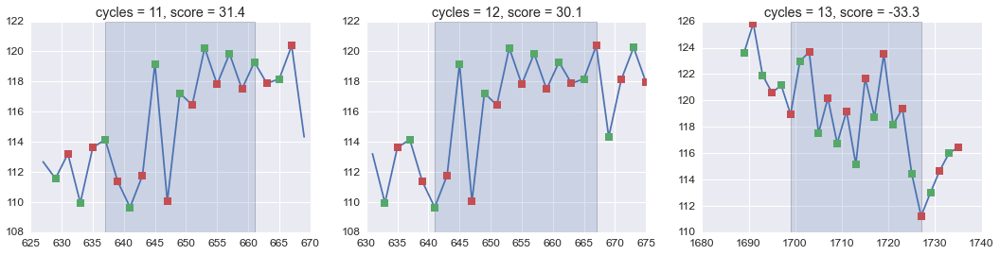

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_outphase QD 1 (209, 118).png

Unpatched_outphase QD 1 Number of bursts: 3


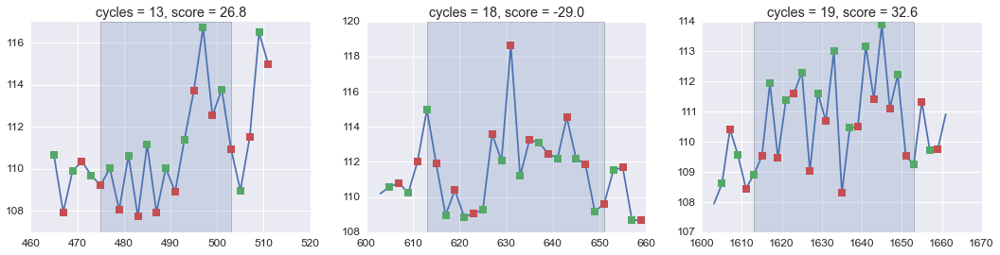

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_outphase QD 2 (221, 61).png

Unpatched_outphase QD 2 Number of bursts: 9


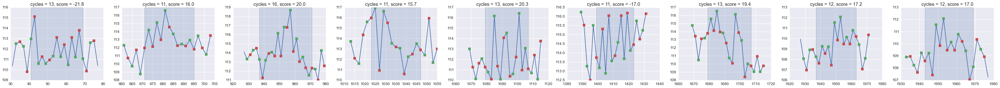

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_outphase QD 3 (247, 133).png

Unpatched_outphase QD 3 Number of bursts: 4


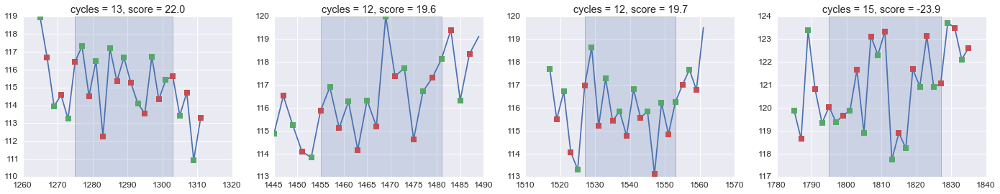

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_outphase QD 5 (104, 49).png

Unpatched_outphase QD 5 Number of bursts: 2


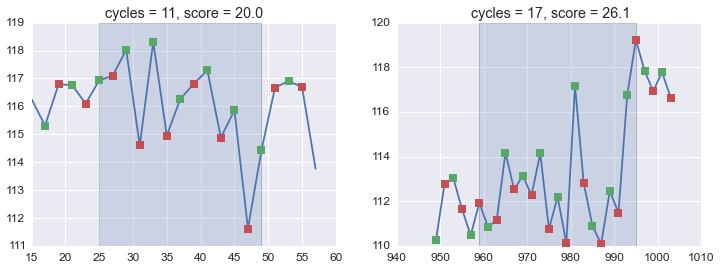

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_outphase QD 7 (26, 141).png

Unpatched_outphase QD 7 Number of bursts: 8


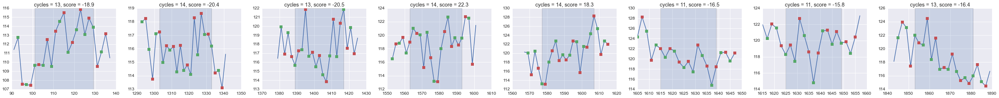

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_outphase QD 8 (21, 165).png

Unpatched_outphase QD 8 Number of bursts: 5


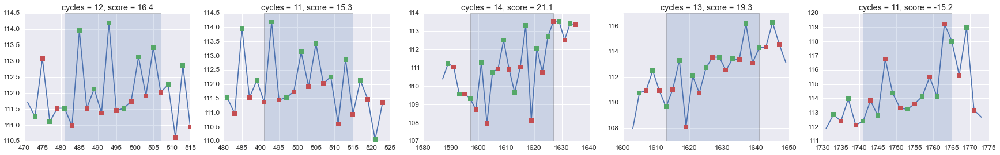

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_outphase QD 10 (226, 41).png

Unpatched_outphase QD 10 Number of bursts: 13


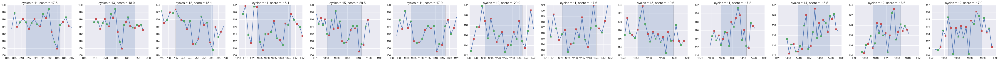

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_outphase QD 11 (195, 49).png

Unpatched_outphase QD 11 Number of bursts: 5


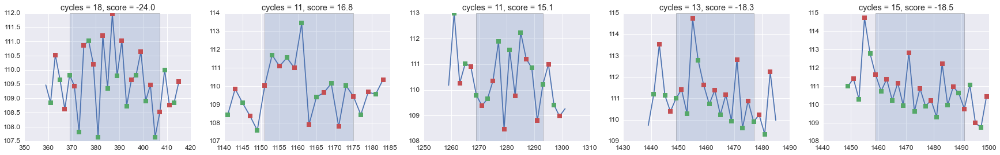

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_outphase QD 12 (194, 140).png

Unpatched_outphase QD 12 Number of bursts: 6


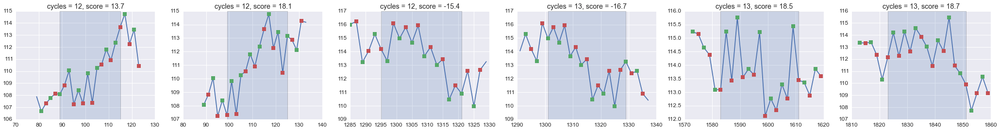

C:\Data\Antonio\software\src\voltagesensing\figures\Take2 Full Timetrace Unpatched_outphase QD 13 (267, 101).png

Unpatched_outphase QD 13 Number of bursts: 5


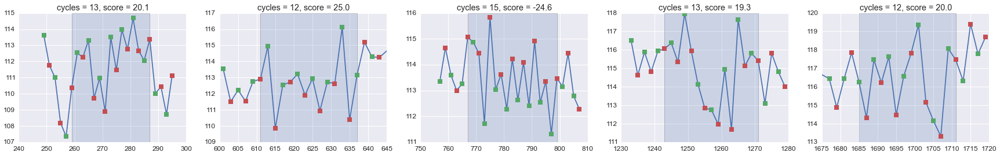

In [65]:
patched = False
inphase = False

label = 'Patched' if patched else 'Unpatched'
if inphase: label += '_inphase'
else: label += '_outphase'
points_sel = points_patched if patched else points_unpatched
ipoints = ipoints_patched if patched else ipoints_unpatched
offset = int(not inphase)

bursts_qd = []
for ipoint in ipoints:
    point = points_sel[ipoint]

    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    timetracem = tt.avg_nsamples(timetracer, 2, running_avg=False, offset=offset)
    t_timetrace = np.arange(timetrace.size)
    t_timetracem = np.arange(timetracem.size)*2 + offset
    t_ra = t_ravg(timetrace.size, inphase=inphase, num_samples=ncycles)
    t_da = t_diffall(timetrace.size, inphase=inphase)
    
    all_diff = tt.edge_diff_all(timetrace, offset=offset)
    rall_diff = tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg)

    signal = all_diff/np.abs(timetracer.mean())*1e2
    score2 = rall_diff/np.abs(timetracer.mean())*1e2
    
    if fraction is not None:
        bs_threshold = (score2**2).max()*fraction
    bursts, score = burstsearch_py(signal, m=ncycles, threshold=bs_threshold, debug=True)
    assert np.allclose(score, score2)
    assert bursts.shape[0] < 20
    bursts_qd.append(bursts)

    fig, ax = plt.subplots(figsize=(200, 4))
    ax.plot(t_timetracem, timetracem, 'k', alpha=0.2)
    ax.plot(t_timetracem[::2], timetracem[::2], 'sg')
    ax.plot(t_timetracem[1::2], timetracem[1::2], 'sr')
    ax.set_ylim(ax.get_ylim()[0]*0.95)
    ax2 = ax.twinx()
    ax2.grid(False)
    ax2.plot(t_ra, score**2)
    for b in bursts:
        ax.axvspan(t_da[b['start']], t_da[b['stop']], alpha=0.15)

    name = 'figures/%s Full Timetrace %s QD %d (%d, %d).png' % (dataset_label, label, ipoint, point[0], point[1])
    plt.savefig(name, bbox_inches='tight')
    plt.close(fig)
    display(FileLink(name))
    print('%s QD %d Number of bursts: %d' % (label, ipoint, bursts.shape[0]))
    
    if bursts.shape[0] > 0:
        itm_start = bursts.start
        itm_stop = bursts.stop + 1

        width_ms = 1e3*((bursts.stop + 1 - bursts.start)*2/400)
        v_on = slice(None, None, 2)
        v_off = slice(1, None, 2)
        fig, ax = plt.subplots(1, bursts.shape[0], figsize=(6*bursts.shape[0], 4), squeeze=False)
        for i in range(bursts.shape[0]):
            pstart = itm_start[i] - pad
            pstop = itm_stop[i] + pad
            pstart = np.clip(pstart, 0, t_timetracem.size - 1)
            pstop = np.clip(pstop, 0, t_timetracem.size - 1)

            tm_on_start = np.nonzero(t_timetracem[v_on] >= t_timetracem[pstart])[0][0]
            tm_on_stop = np.nonzero(t_timetracem[v_on] <= t_timetracem[pstop])[0][-1]
            tm_off_start = np.nonzero(t_timetracem[v_off] >= t_timetracem[pstart])[0][0]
            tm_off_stop = np.nonzero(t_timetracem[v_off] <= t_timetracem[pstop])[0][-1]

            ax[0,i].plot(t_timetracem[pstart:pstop], timetracem[pstart:pstop], '-')
            ax[0,i].plot(t_timetracem[v_on][tm_on_start:tm_on_stop], timetracem[v_on][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].plot(t_timetracem[v_off][tm_on_start:tm_on_stop], timetracem[v_off][tm_on_start:tm_on_stop], 's', ms=8)
            ax[0,i].axvspan(t_timetracem[itm_start[i]], t_timetracem[itm_stop[i]], alpha=0.2, linewidth=1)

            ax[0,i].set_title('cycles = %d, score = %.1f' % (bursts.stop[i] - bursts.start[i], bursts.score[i]))
        plt.close(fig)
        display(fig)
if patched and inphase:
    bursts_qd_patched = bursts_qd
elif patched and not inphase:
    bursts_qd_patchedo = bursts_qd
elif not patched and inphase:
    bursts_qd_unpatched = bursts_qd
elif not patched and not inphase:
    bursts_qd_unpatchedo = bursts_qd

## Aggregate scores and widths

In [66]:
scores_patched, widths_patched = [], []
for bursts in bursts_qd_patched:
    scores_patched.append(bursts.score)
    widths_patched.append(bursts.stop - bursts.start + 1)
scores_patchedc = np.concatenate(scores_patched)
widths_patchedc = np.concatenate(widths_patched)

scores_patchedc.size, scores_patched

(40,
 [array([-26.1665229 , -31.14944872,  26.97694825]),
  array([-39.43695133]),
  array([-43.75027697, -27.92682894]),
  array([-14.33639957, -18.67279858, -18.24397897, -14.07148359,
         -13.66777166,  17.03778366,  16.71382173, -20.08634522]),
  array([-11.76423267, -14.45021054, -13.05321867, -12.0692193 ,
          12.61594059,  12.55025808,  14.10235199, -15.34874775]),
  array([-16.21281701, -15.90622644,  15.49931197, -18.08198026,
         -16.52009498, -15.34326641, -15.29224416, -15.62477488,
          18.97534899, -17.90128098,  21.6441949 ,  19.17985234,
          15.16415498,  16.05983439]),
  array([ 20.41286596]),
  array([ 21.98593352, -17.52316045, -16.40422292])])

In [67]:
scores_unpatched, widths_unpatched = [], []
for bursts in bursts_qd_unpatched:
    scores_unpatched.append(bursts.score)
    widths_unpatched.append(bursts.stop - bursts.start + 1)
scores_unpatchedc = np.concatenate(scores_unpatched)
widths_unpatchedc = np.concatenate(widths_unpatched)

scores_unpatchedc.size, scores_unpatched

(81, [array([-18.02600024, -23.20499945, -18.51457051, -18.87911922,
         -26.97750205, -20.22268021, -18.64690905, -18.46634418,
         -17.40597855, -17.95061738, -21.22231666, -18.02801488,
         -17.74424754,  18.316214  ,  18.49242048]),
  array([ 16.18778357, -16.46567513,  20.36082551, -22.81473898,
          19.44588037,  15.78292569, -21.92427079, -21.39317594,
         -19.62630193, -22.10519291]),
  array([ 18.77250842,  18.60845585, -23.23020754, -19.35836926,
          23.71787226,  20.36601023, -19.96801947]),
  array([-20.61667434,  20.21831119,  18.19978812, -17.16669223,
         -17.53097989, -22.41404501, -17.55918768]),
  array([-19.39464372, -18.23307643, -23.52132506, -24.02033395,
         -18.33677144, -18.71050946]),
  array([-39.79210067,  24.66734929,  26.00128043, -26.18947337]),
  array([ 15.56843947, -16.87768688, -27.6654526 , -16.35846049,
         -16.16418925,  22.80010186,  18.56112181]),
  array([-30.81322072, -23.90854318, -27.64319104, -22

In [68]:
scores_patchedo, widths_patchedo = [], []
for bursts in bursts_qd_patchedo:
    scores_patchedo.append(bursts.score)
    widths_patchedo.append(bursts.stop - bursts.start + 1)
scores_patchedco = np.concatenate(scores_patchedo)
widths_patchedco = np.concatenate(widths_patchedo)

scores_patchedco.size, scores_patchedo

(56, [array([ 25.64632039, -20.56947287, -23.180898  ,  28.77722876,
         -20.39587211,  20.91845629,  20.86827085, -24.89170313,  19.92616758]),
  array([ 22.39601728,  22.97028028,  29.28680134,  21.99702786,
          21.97103085,  22.24356793]),
  array([ 41.84700194,  27.66979357,  29.82796375]),
  array([ 25.35552424, -17.89376125, -19.18096123]),
  array([ 17.33918207, -13.46858429, -15.06480469,  13.93017531,
          15.85201239,  13.03145656,  13.05332416,  14.36542595]),
  array([-18.71921901,  21.1982475 , -23.89067943,  20.28592207, -19.63933196]),
  array([ 11.49965054, -11.78788777, -14.86519836, -12.22989918,
         -14.55065155, -14.93336472]),
  array([ 18.61302411, -16.00139804,  15.18995809,  17.16575142,
         -14.63197959, -19.29798966, -20.84303874,  19.88130109,
          15.67175292,  19.01931953,  15.64642971,  17.77658408,
          15.72235236,  15.74771392,  18.86683981, -15.62104667])])

In [69]:
scores_unpatchedo, widths_unpatchedo = [], []
for bursts in bursts_qd_unpatchedo:
    scores_unpatchedo.append(bursts.score)
    widths_unpatchedo.append(bursts.stop - bursts.start + 1)
scores_unpatchedco = np.concatenate(scores_unpatchedo)
widths_unpatchedco = np.concatenate(widths_unpatchedo)

scores_unpatchedco.size, scores_unpatchedo

(63,
 [array([ 31.43943514,  30.10273359, -33.3479003 ]),
  array([ 26.81074396, -28.97883157,  32.57758942]),
  array([-21.84245144,  15.98362423,  19.9963399 ,  15.65534478,
          20.31905702, -16.99159137,  19.40512354,  17.2003772 ,  16.96930735]),
  array([ 21.95957473,  19.63625716,  19.65660574, -23.94307941]),
  array([ 19.97552229,  26.07399106]),
  array([-18.89126632, -20.40726542, -20.45472564,  22.28341423,
          18.25096805, -16.49381775, -15.84655255, -16.36822769]),
  array([ 16.4194261 ,  15.31326452,  21.12948045,  19.34309041, -15.17071121]),
  array([ 17.76217354,  17.97874047,  18.14379354, -18.08701152,
          29.51328303,  17.87042367, -20.92920634, -17.62674332,
         -19.57631551, -17.16636554, -13.48182193, -16.56716324, -17.92520428]),
  array([-24.00732944,  16.76023807,  15.08462629, -18.30114413, -18.46366638]),
  array([ 13.67608007,  18.10962746, -15.38444292, -16.73827096,
          18.53471612,  18.74618138]),
  array([ 20.14274293,  24.9

## Violin plots

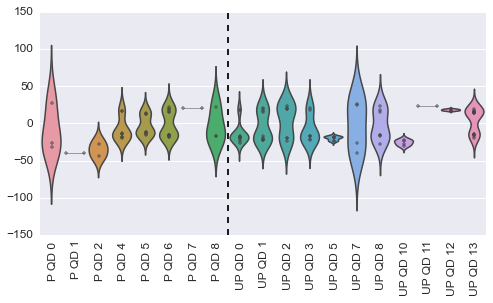

In [70]:
fig, ax = plt.subplots(figsize=(8, 4))

names_p = ['P QD %d' % i for i in ipoints_patched]
names_u = ['UP QD %d' % i for i in ipoints_unpatched]
sns.violinplot(scores_patched + scores_unpatched, inner='points', names=names_p + names_u)
plt.axvline(len(ipoints_patched) + 0.5, ls='--', color='k')
plt.xticks(rotation=90)
#ax.set_xlim(-0.5);

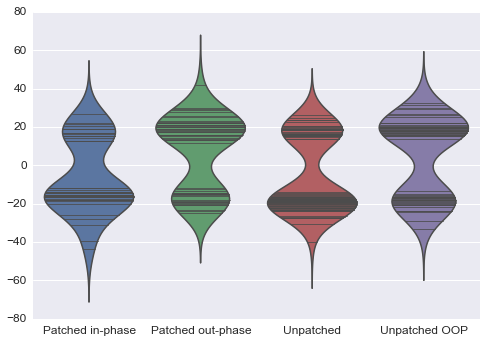

In [71]:
sns.violinplot([scores_patchedc, scores_patchedco, scores_unpatchedc, scores_unpatchedco], names=['Patched in-phase', 'Patched out-phase', 'Unpatched', 'Unpatched OOP'],  inner='stick');

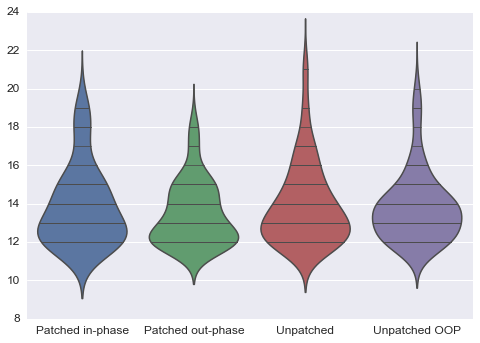

In [72]:
sns.violinplot([widths_patchedc, widths_patchedco, widths_unpatchedc, widths_unpatchedco], names=['Patched in-phase', 'Patched out-phase', 'Unpatched', 'Unpatched OOP'],  inner='stick');

# Signal Histograms

In [73]:
sns.set_style('ticks')
sns.set_context('notebook', font_scale=1.2)
multi_ncycles = [2, 8, 18]
running_avg = True
clip_radius = 1.8
detrend_sigma = 300
normalize_intensity = True
hist_style = dict(
        lw = 1.6,
        alpha = 0.6,
        histtype = 'stepfilled')

In [74]:
patched = True

points_sel = points_patched if patched else points_unpatched
ipoints = ipoints_patched if patched else ipoints_unpatched

n_alt_diff, n_alt_diffo = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}
for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        alt_diff = tt.edge_diff_all(timetrace_on, offset=0) 
        alt_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
        n_alt_diff[ncycles].append(
            tt.avg_nsamples(alt_diff, num_samples=ncycles, running_avg=running_avg))
        n_alt_diffo[ncycles].append(
            tt.avg_nsamples(alt_diffo, num_samples=ncycles, running_avg=running_avg))

nbins = 25
name = '%d-cycles avg of alt. diff.' % ncycles
fig, ax = plt.subplots(len(ipoints), len(multi_ncycles), 
                       figsize=(4*len(multi_ncycles), 3*len(ipoints)))
fig.tight_layout()
for ip, ipoint in enumerate(ipoints):
    point = points_sel[ipoint]
        
    if normalize_intensity:
        timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
        norm = 1e2/np.abs(timetracer.mean())
    else:
        norm = 1.
    
    for cidx, ncycles in enumerate(multi_ncycles):
        sample, sampleo = n_alt_diff[ncycles][ip], n_alt_diffo[ncycles][ip]
        
        bin_abs_max = np.max([np.abs(sample).max(), np.abs(sampleo).max()])
        bins = np.linspace(-bin_abs_max*1.1, bin_abs_max*1.1, nbins+1)
        centers = bins[:-1] + 0.5*(bins[1] - bins[0])

        ax[ip, cidx].hist(n_alt_diff[ncycles][ip]*norm, bins=bins, label='QD %d in-phase' % ip, color=colors[1], edgecolor=colors[1], **hist_style)
        ax[ip, cidx].hist(n_alt_diffo[ncycles][ip]*norm, bins=bins, label='QD %d out-of-phase' % ip, color='gray', edgecolor='gray', zorder=-1, **hist_style)
        ax[ip, cidx].axvline((n_alt_diff[ncycles][ip]*norm).mean(), color='k', alpha=0.9)
        ax[ip, cidx].axvline((n_alt_diffo[ncycles][ip]*norm).mean(), color='k', ls='--', alpha=0.9)
        
        ax[0, cidx].set_title('Patched: %d-cycles average' % ncycles)
    ax[ip, 0].legend(loc='upper left')
sns.despine(fig)
plt.close(fig)
if patched:
    fig_patched = fig
else:
    fig_unpatched = fig

In [75]:
patched = False

if patched:
    points_sel = points_patched
else:
    points_sel = points_unpatched

n_alt_diff, n_alt_diffo = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}
for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        alt_diff = tt.edge_diff_all(timetrace_on, offset=0) 
        alt_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
        n_alt_diff[ncycles].append(
            tt.avg_nsamples(alt_diff, num_samples=ncycles, running_avg=running_avg))
        n_alt_diffo[ncycles].append(
            tt.avg_nsamples(alt_diffo, num_samples=ncycles, running_avg=running_avg))

nbins = 25
name = '%d-cycles avg of alt. diff.' % ncycles
fig, ax = plt.subplots(len(ipoints), len(multi_ncycles), 
                       figsize=(4*len(multi_ncycles), 3*len(ipoints)))
fig.tight_layout()
for ip, ipoint in enumerate(ipoints):
    point = points_sel[ipoint]
        
    if normalize_intensity:
        timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
        norm = 1e2/np.abs(timetracer.mean())
    else:
        norm = 1.
    
    for cidx, ncycles in enumerate(multi_ncycles):
        sample, sampleo = n_alt_diff[ncycles][ip], n_alt_diffo[ncycles][ip]
        
        bin_abs_max = np.max([np.abs(sample).max(), np.abs(sampleo).max()])
        bins = np.linspace(-bin_abs_max*1.1, bin_abs_max*1.1, nbins+1)
        centers = bins[:-1] + 0.5*(bins[1] - bins[0])

        ax[ip, cidx].hist(n_alt_diff[ncycles][ip]*norm, bins=bins, label='QD %d in-phase' % ip, color=colors[1], edgecolor=colors[1], **hist_style)
        ax[ip, cidx].hist(n_alt_diffo[ncycles][ip]*norm, bins=bins, label='QD %d out-of-phase' % ip, color='gray', edgecolor='gray', zorder=-1, **hist_style)
        ax[ip, cidx].axvline((n_alt_diff[ncycles][ip]*norm).mean(), color='k', alpha=0.9)
        ax[ip, cidx].axvline((n_alt_diffo[ncycles][ip]*norm).mean(), color='k', ls='--', alpha=0.9)
        
        ax[0, cidx].set_title('Patched: %d-cycles average' % ncycles)
    ax[ip, 0].legend(loc='upper left')
plt.close(fig)
if patched:
    fig_patched = fig
else:
    fig_unpatched = fig

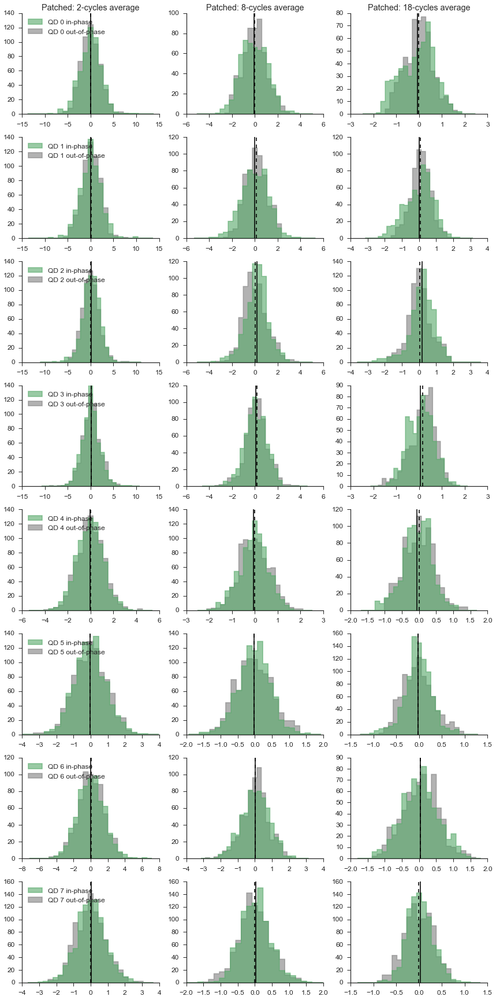

In [76]:
fig_patched

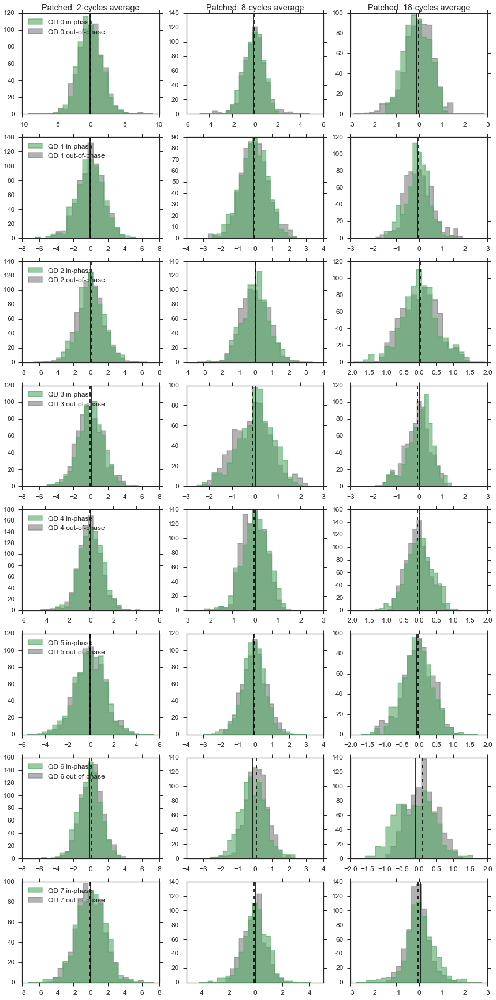

In [77]:
fig_unpatched

# All QD Means

In [78]:
ipoints_patched

[0, 1, 2, 4, 5, 6, 7, 8]

In [79]:
points_sel = [points_patched[i] for i in ipoints_patched]
multi_ncycles = [8, 12, 18, 36]
running_avg = False
clip_radius = 1.8
detrend_sigma = 300

rall_diff_n, rall_diff_no = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}

for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        all_diff = tt.edge_diff_all(timetrace_on, offset=0)
        rall_diff_n[ncycles].append(
            tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg))
        
        all_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
        rall_diff_no[ncycles].append(
            tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg))

signal_cycle = np.zeros((len(points_sel), len(multi_ncycles)))
signal_cycleo = np.zeros((len(points_sel), len(multi_ncycles)))
sigma_cycle = np.zeros((len(points_sel), len(multi_ncycles)))
sigma_cycleo = np.zeros((len(points_sel), len(multi_ncycles)))
for ip, point in enumerate(points_sel):
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    
    signal = [rall_diff_n[nc][ip]/np.abs(timetracer.mean())*1e2 for nc in multi_ncycles]
    signal_cycle[ip] = [s.mean() for s in signal]
    sigma_cycle[ip] = [s.std()/np.sqrt(s.size) for s in signal]
    
    signal = [rall_diff_no[nc][ip]/np.abs(timetracer.mean())*1e2 for nc in multi_ncycles]
    signal_cycleo[ip] = [s.mean() for s in signal]
    sigma_cycleo[ip] = [s.std()/np.sqrt(s.size) for s in signal]

In [80]:
points_sel = points_unpatched

rall_diff_n, rall_diff_no = {n: [] for n in multi_ncycles}, {n: [] for n in multi_ncycles}

for ncycles in multi_ncycles:
    for ip, point in enumerate(points_sel):
        
        timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
        #timetrace_on = timetrace
        time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

        all_diff = tt.edge_diff_all(timetrace_on, offset=0)
        rall_diff_n[ncycles].append(
            tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg))
        
        all_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
        rall_diff_no[ncycles].append(
            tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg))

signal_cycleu = np.zeros((len(points_sel), len(multi_ncycles)))
signal_cycleuo = np.zeros((len(points_sel), len(multi_ncycles)))
sigma_cycleu = np.zeros((len(points_sel), len(multi_ncycles)))
sigma_cycleuo = np.zeros((len(points_sel), len(multi_ncycles)))
for ip, point in enumerate(points_sel):
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    
    signal = [rall_diff_n[nc][ip]/np.abs(timetracer.mean())*1e2 for nc in multi_ncycles]
    signal_cycleu[ip] = [s.mean() for s in signal]
    sigma_cycleu[ip] = [s.std()/np.sqrt(s.size) for s in signal]
    
    signal = [rall_diff_no[nc][ip]/np.abs(timetracer.mean())*1e2 for nc in multi_ncycles]
    signal_cycleuo[ip] = [s.mean() for s in signal]
    sigma_cycleuo[ip] = [s.std()/np.sqrt(s.size) for s in signal]

C:\Users\laser2002j\Anaconda\lib\site-packages\matplotlib\axes\_axes.py:475: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


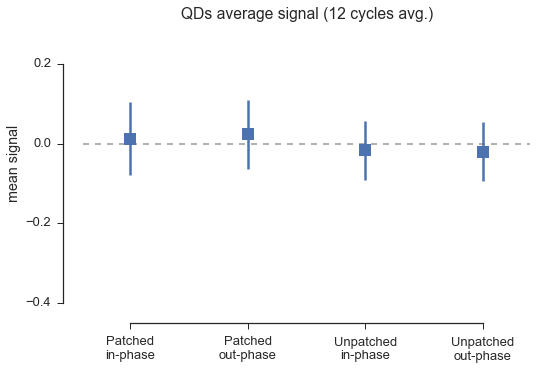

In [81]:
sns.set_context('notebook', font_scale=1.3)
sns.set_style('ticks')
alpha=1
fig, ax = plt.subplots(figsize=(8, 5))

icycle = 1
y = np.array([s.mean(axis=0)[icycle] for s in (signal_cycle, signal_cycleo, signal_cycleu, signal_cycleuo)])
yerr =  np.array([s.mean(axis=0)[icycle] for s in (sigma_cycle, sigma_cycleo, sigma_cycleu, sigma_cycleuo)])
x = np.arange(len(y))
ax.errorbar(x=x, y=y, yerr=yerr, ls='', marker='s', ms=12, lw=2.5,)#capsize=8, capthick=1.6)
ax.axhline(0, color='gray', zorder=-1, alpha=0.7, ls='--')
ax.legend(loc='upper left', ncol=2)

ax.set_title('QDs average signal (%d cycles avg.)' % multi_ncycles[icycle])
ax.set_ylabel('mean signal')
ax.set_ylim(-0.4, 0.3)
ax.set_xlim(-0.4, 3.4)
plt.xticks([0, 1, 2, 3], ['Patched\nin-phase', 'Patched\nout-phase', 'Unpatched\nin-phase', 'Unpatched\nout-phase'])
ax.locator_params(axis='y', tight=True, nbins=4)
sns.despine(offset=20, trim=True);
#yerr

In [82]:
points_sel = [points_patched[i] for i in ipoints_patched]
ncycles = 18
running_avg = True
clip_radius = 1.8
detrend_sigma = 300

rall_diff, rall_diffo = [], []
signal_tot, signal_toto = [], []
for ip, point in enumerate(points_sel):
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    all_diff = tt.edge_diff_all(timetrace_on, offset=0)
    rall_diff.append(
            tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg))
    signal_tot.append(rall_diff[-1]/np.abs(timetracer.mean())*1e2)

    all_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
    rall_diffo.append(
            tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg))
    signal_toto.append(rall_diffo[-1]/np.abs(timetracer.mean())*1e2)

In [83]:
points_sel = points_unpatched

rall_diff, rall_diffo = [], []
signal_totu, signal_totuo = [], []
for ip, point in enumerate(points_sel):
    timetracer = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=None, zero_mean=False)
    
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    all_diff = tt.edge_diff_all(timetrace_on, offset=0)
    rall_diff.append(
            tt.avg_nsamples(all_diff, num_samples=ncycles, running_avg=running_avg))
    signal_totu.append(rall_diff[-1]/np.abs(timetracer.mean())*1e2)

    all_diffo = tt.edge_diff_all(timetrace_on, offset=1)        
    rall_diffo.append(
            tt.avg_nsamples(all_diffo, num_samples=ncycles, running_avg=running_avg))
    signal_totuo.append(rall_diffo[-1]/np.abs(timetracer.mean())*1e2)

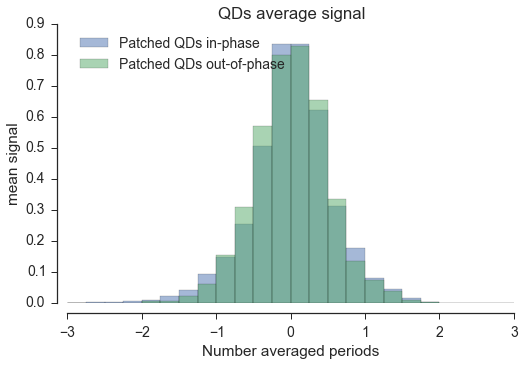

In [84]:
sns.set_context('notebook', font_scale=1.4)
sns.set_style('ticks')
hist_style = dict(
    bins = np.arange(-3, 3.1, 0.25),
    alpha=0.5,
    normed=True)

fig, ax = plt.subplots(figsize=(8, 5))
ax.hist(np.concatenate(signal_tot), color=colors[0], label='Patched QDs in-phase', **hist_style)
ax.hist(np.concatenate(signal_toto), color=colors[1], label='Patched QDs out-of-phase', **hist_style)
#ax.hist(np.concatenate(signal_totu), color=colors[2], label='Unpatched QDs in-phase', **hist_style)
#ax.hist(np.concatenate(signal_totuo), color=colors[3], label='Unpatched QDs out-of-phase', **hist_style)

ax.legend(loc='upper left', ncol=1)

ax.set_title('QDs average signal')
ax.set_xlabel('Number averaged periods')
ax.set_ylabel('mean signal')
#ax.set_ylim(0, 0.15)
#ax.set_xlim(-4, 4)
sns.despine(offset=10, trim=True);

# Auto-correlation analysis

The ACF approach turns out to be less sensitive than using the alternated differences. This section is left here only as a reference.

In [85]:
def acf(series):
    dseries = series - series.mean()
    full_size = 2*series.size - 1
    tau = np.arange(0, (full_size+1)/2)
    acf_full = np.correlate(dseries, dseries, mode='full')/(dseries*dseries).sum()
    assert acf_full[(full_size-1)/2:].size == (full_size+1)/2
    return tau, acf_full[(full_size-1)/2:]

In [86]:
points_sel = points_patched
clip_radius = 2
detrend_sigma = None

acf_res = []
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace += 0.5*sim_signal
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    acf_res.append(acf(timetrace_on))

scales = [16, 64, 512]
fig, ax = plt.subplots(len(points_sel), len(scales), 
                       figsize=(4*len(scales), 3*len(points_sel)))
fig.tight_layout()
for ip, point in enumerate(points_sel):
    for cidx, ncrop in enumerate(scales):
        ax[ip, cidx].plot(acf_res[ip][0][:ncrop], acf_res[ip][1][:ncrop], '-o', mew=0, ms=6, 
                          color=colors[ip], label='QD %d' % ip)
        #ax[ip, cidx].set_yscale('log')
    ax[ip, -1].legend()
    ax[ip, 1].set_title('ACF Patched QD %d' % ip)
plt.close(fig)
fig_patched = fig;

In [87]:
points_sel = points_unpatched

acf_res = []
for ip, point in enumerate(points_sel):
    timetrace = tt.get_timetrace(data.video, point=point, clip_radius=clip_radius, detrend_sigma=detrend_sigma)
    #timetrace_on = timetrace
    time_on, timetrace_on = tt.get_on_periods_timetrace(timetrace, thresholds[ip], lowpass_sigma=10, align=4)

    acf_res.append(acf(timetrace_on))

scales = [16, 64, 512]
fig, ax = plt.subplots(len(points_sel), len(scales), 
                       figsize=(4*len(scales), 3*len(points_sel)))
fig.tight_layout()
for ip, point in enumerate(points_sel):
    for cidx, ncrop in enumerate(scales):
        ax[ip, cidx].plot(acf_res[ip][0][:ncrop], acf_res[ip][1][:ncrop], '-o', mew=0, ms=6, 
                          color=colors[ip], label='QD %d' % ip)
        #ax[ip, cidx].set_yscale('log')
    ax[ip, -1].legend()
    ax[ip, 1].set_title('ACF Unpatched QD %d' % ip)
plt.close(fig)
fig_unpatched = fig;

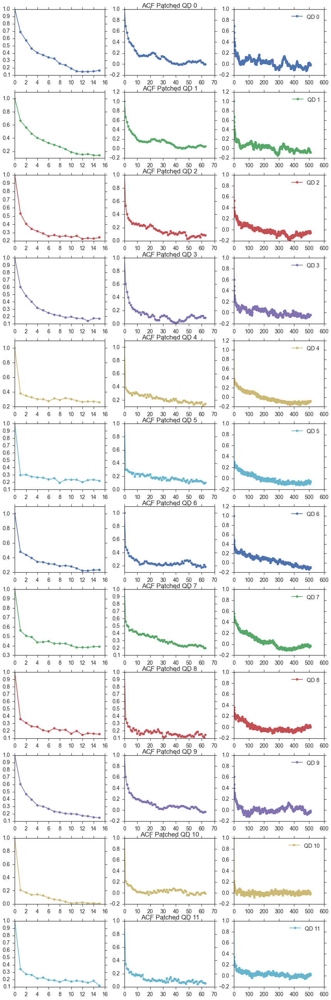

In [88]:
display(fig_patched)

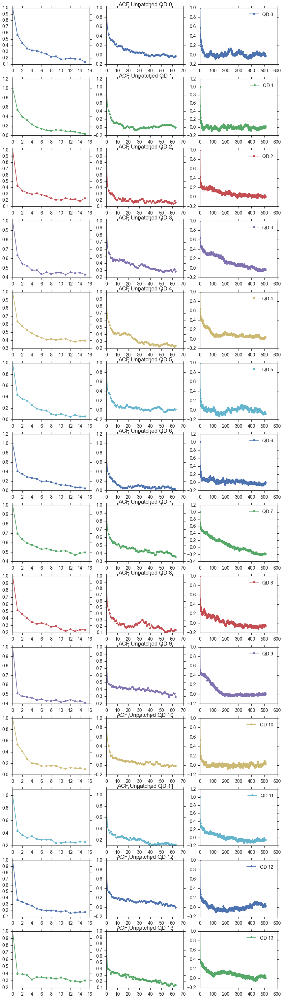

In [89]:
display(fig_unpatched)

# Tests

Run consistency tests for the library functions:

In [90]:
tt.test_edge_diff(timetrace)